In [1]:
from astroquery.sdss import SDSS
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import math
import numpy as np
from specutils import Spectrum
from specutils.fitting import fit_generic_continuum
from specutils.manipulation import LinearInterpolatedResampler
from labellines import labelLines
import matplotlib.axes as axes
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import scipy
from PIL import Image
from fpdf import FPDF
import random
import os

In [2]:
galaxy_fits = fits.open('parameters_new.fits', memmap=True)

galaxy_data = galaxy_fits[1].data
galaxy_fits.info()
print(galaxy_fits[1].columns)

Filename: parameters_new.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     86   1286R x 39C   ['J', 'J', 'J', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D']   
ColDefs(
    name = 'plate'; format = 'J'
    name = 'mjd'; format = 'J'
    name = 'fiber'; format = 'J'
    name = 'oiii_continuuum'; format = 'D'
    name = 'oiii_continuuum_err'; format = 'D'
    name = 'oiii'; format = 'D'
    name = 'oiii_err'; format = 'D'
    name = 'he_i'; format = 'D'
    name = 'he_i_err'; format = 'D'
    name = 'fe_i/ii'; format = 'D'
    name = 'fe_i/ii_err'; format = 'D'
    name = 'h_beta'; format = 'D'
    name = 'h_beta_err'; format = 'D'
    name = 'broad_oiii'; format = 'D'
    name = 'broad_oiii_err'; format = 'D'
    name = 'sigma1_oiii'; format = 'D'
    n

In [3]:
galaxy_fits = fits.open('parameters_nobroad.fits', memmap=True)

galaxy_data_nobroad = galaxy_fits[1].data
galaxy_fits.info()
print(galaxy_fits[1].columns)

Filename: parameters_nobroad.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     62   1286R x 27C   ['J', 'J', 'J', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D', 'D']   
ColDefs(
    name = 'plate'; format = 'J'
    name = 'mjd'; format = 'J'
    name = 'fiber'; format = 'J'
    name = 'oiii_continuuum_nobroad'; format = 'D'
    name = 'oiii_continuuum_nobroad_err'; format = 'D'
    name = 'oiii_nobroad'; format = 'D'
    name = 'oiii_nobroad_err'; format = 'D'
    name = 'he_i_nobroad'; format = 'D'
    name = 'he_i_nobroad_err'; format = 'D'
    name = 'fe_i/ii_nobroad'; format = 'D'
    name = 'fe_i/ii_nobroad_err'; format = 'D'
    name = 'h_beta_nobroad'; format = 'D'
    name = 'h_beta_nobroad_err'; format = 'D'
    name = 'sigma_oiii_nobroad'; format = 'D'
    name = 'sigma_oiii_nobroad_err'; format = 'D'
    

In [3]:
c = 3*10**5 #km/s
inf = math.inf

def o_iii_1(x, amp, sig, v):
    x_0 = 5008.240* (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2))/0.331)
    
def o_iii_2(x, amp, sig, v):
    x_0 = 4960.295 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def broad_1(x, amp, sig, v):
    x_0 = 5008.240* (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2))/0.331)

def broad_2(x, amp, sig, v):
    x_0 = 4960.295 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def he_i(x, amp, sig, v):
    x_0 = 5017.077 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def fe(x, amp, sig, v):
    x_0 = 4987.20 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def h_beta(x, amp, sig, v):
    x_0 = 4862.68 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def Gauss_oiii(x,B,amp1, amp2, amp3, amp4,amp5, sig1, sig2, v_n, v_b):
    return B+o_iii_1(x, amp1, sig1, v_n) + o_iii_2(x, amp1, sig1, v_n) + broad_1(x, amp5, sig2, v_b) + broad_2(x, amp5, sig2, v_b) + he_i(x, amp2, sig1, v_n) + fe(x, amp3, sig1, v_n)+h_beta(x, amp4, sig1, v_n)

In [4]:
c = 3*10**5 #km/s
inf = math.inf

def o_iii_1(x, amp, sig, v):
    x_0 = 5008.240* (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2))/0.331)
    
def o_iii_2(x, amp, sig, v):
    x_0 = 4960.295 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def he_i(x, amp, sig, v):
    x_0 = 5017.077 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def fe(x, amp, sig, v):
    x_0 = 4987.20 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def h_beta(x, amp, sig, v):
    x_0 = 4862.68 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x - x_0)**2 / (2 * wid**2)))

def Gauss_oiii_no_broad(x,B,amp1, amp2, amp3,amp4, sig, v_n):
    return B+o_iii_1(x, amp1, sig, v_n) + o_iii_2(x, amp1, sig, v_n)+ he_i(x, amp2, sig, v_n) + fe(x, amp3, sig, v_n)+h_beta(x, amp4, sig, v_n)

In [5]:
c = 3*10**5 #km/s
inf = math.inf

def h_alpha(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_1(x, amp, sig, v):
    x_0 = 6549.86 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_2(x, amp, sig, v):
    x_0 = 6585.27 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2))/0.326)

def broad(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * (wid)**2)))

def Gauss_h_alpha(x, b,amp1, amp2, amp3, sig1, sig2, v_n, v_b):
    return  b + h_alpha(x, amp1, sig1, v_n) + n_ii_1(x, amp2, sig1, v_n) + n_ii_2(x, amp2, sig1, v_n) + broad(x, amp3, sig2, v_b)

In [6]:
c = 3*10**5 #km/s
inf = math.inf

def h_alpha(x, amp, sig, v):
    x_0 = 6564.61 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_1(x, amp, sig, v):
    x_0 = 6549.86 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2)))

def n_ii_2(x, amp, sig, v):
    x_0 = 6585.27 * (1+(v/c))
    wid= sig*x_0/c
    return (amp * np.exp(-(x- x_0)**2 / (2 * wid**2))/0.326)

def Gauss_h_alpha_no_broad(x, b,amp1, amp2, sig, v_n):
    return  b + h_alpha(x, amp1, sig, v_n) + n_ii_1(x, amp2, sig, v_n) + n_ii_2(x, amp2, sig, v_n)

In [141]:
selection = galaxy_data[((galaxy_data['sigma2_oiii']/galaxy_data['sigma2_oiii_err'])>4) & (np.round(galaxy_data['broad_oiii'],5) != 0)&(np.round(galaxy_data['sigma2_oiii'],3) < 2999) & (galaxy_data['sigma2_oiii']>500)]
print(len(selection))

18


C:\Users\nihad\AppData\Local\Temp\ipykernel_28060\522996464.py:1: RuntimeWarning: divide by zero encountered in divide
  selection = galaxy_data[((galaxy_data['sigma2_oiii']/galaxy_data['sigma2_oiii_err'])>4) & (np.round(galaxy_data['broad_oiii'],5) != 0)&(np.round(galaxy_data['sigma2_oiii'],3) < 2999) & (galaxy_data['sigma2_oiii']>500)]


0
3771-55544-0724
7055 7988


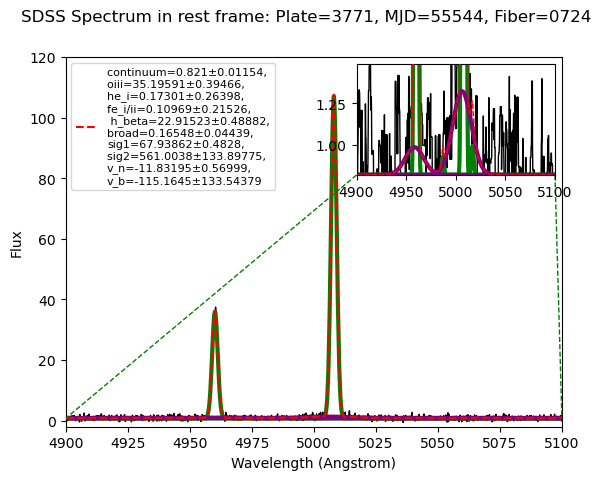

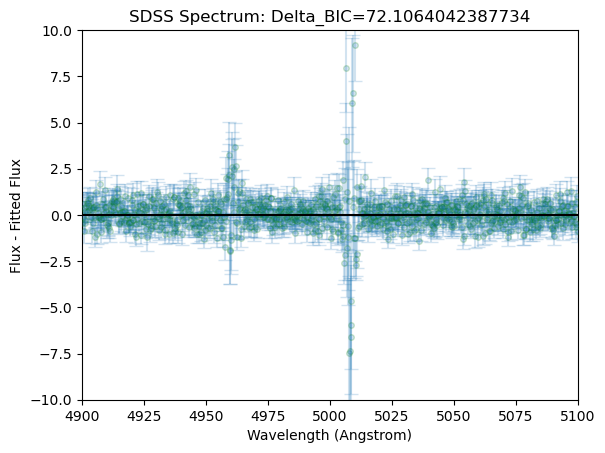

3158 3631


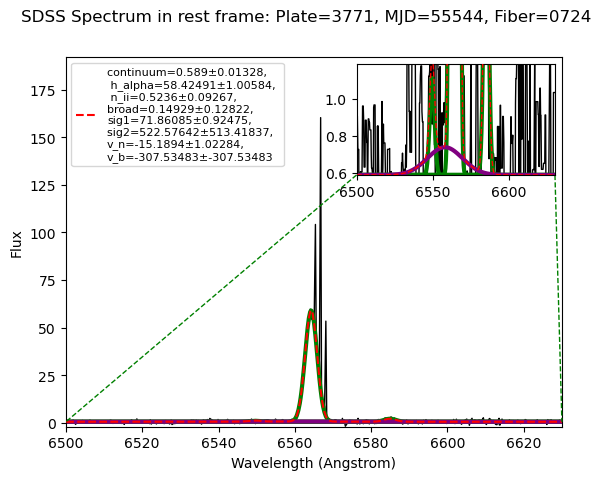

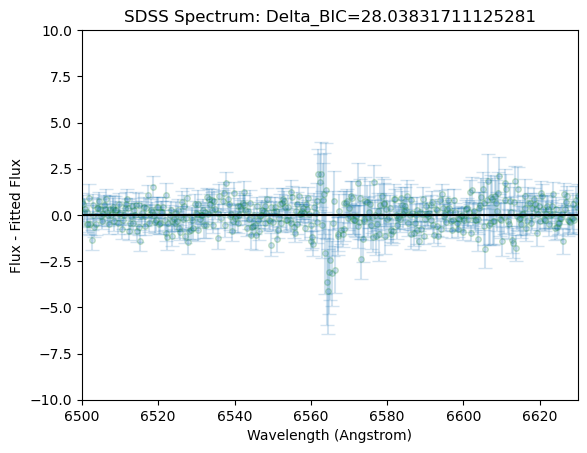

1
3830-55574-0909
9448 10598


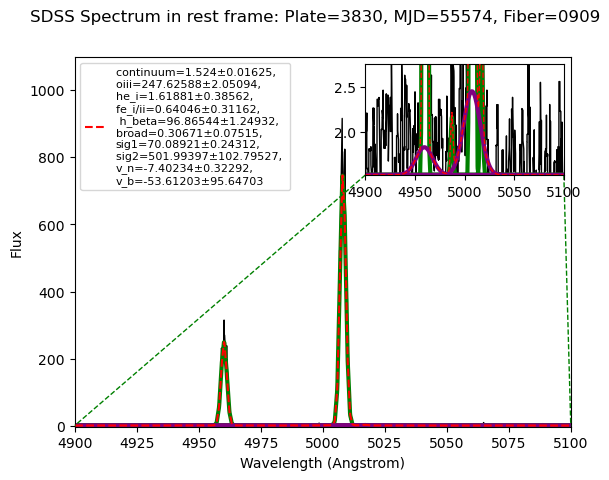

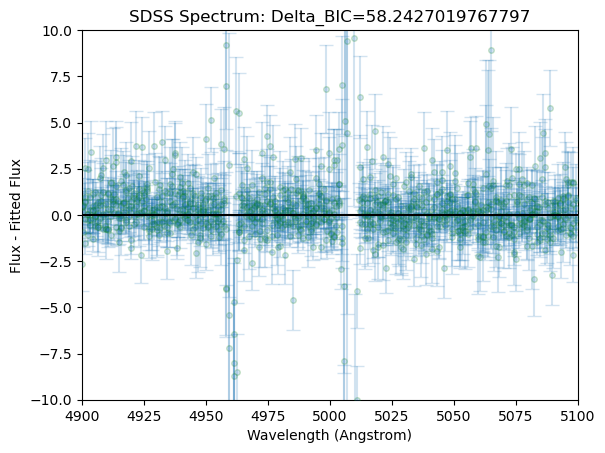

4829 5418


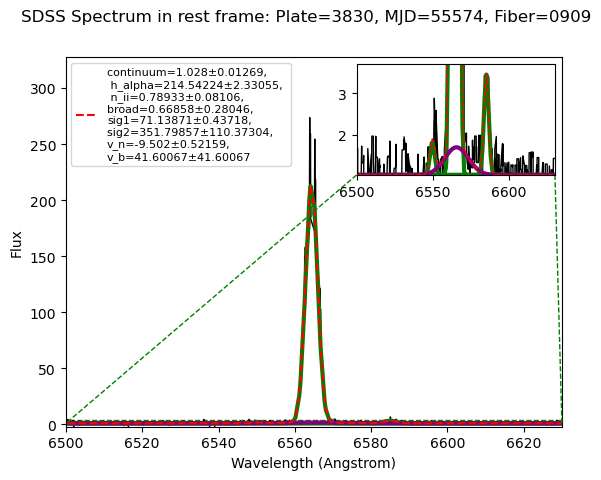

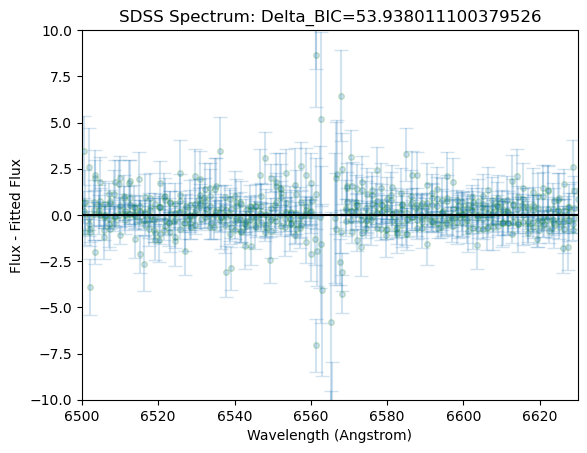

2
4233-55449-0623
9138 10278


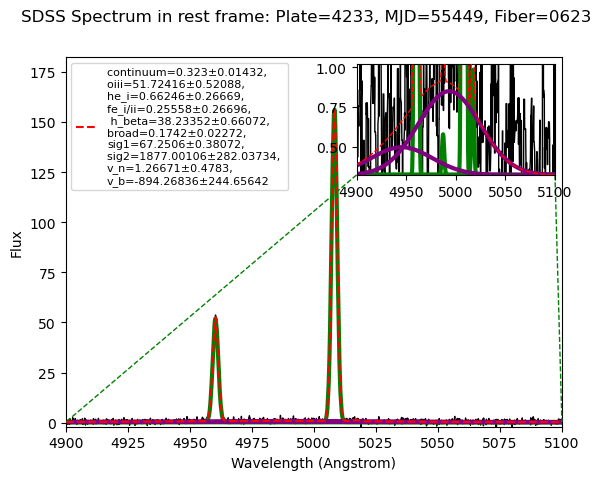

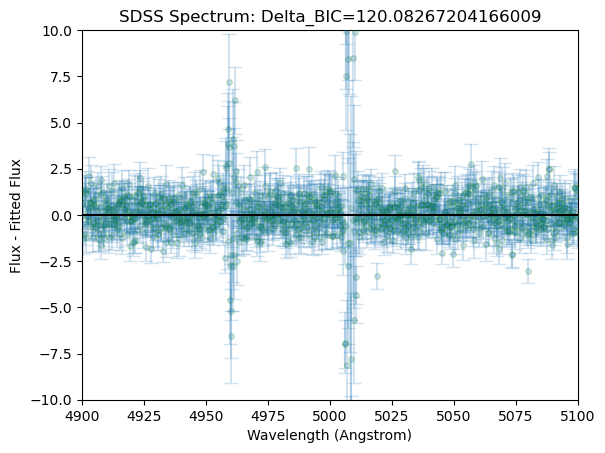

4508 5090


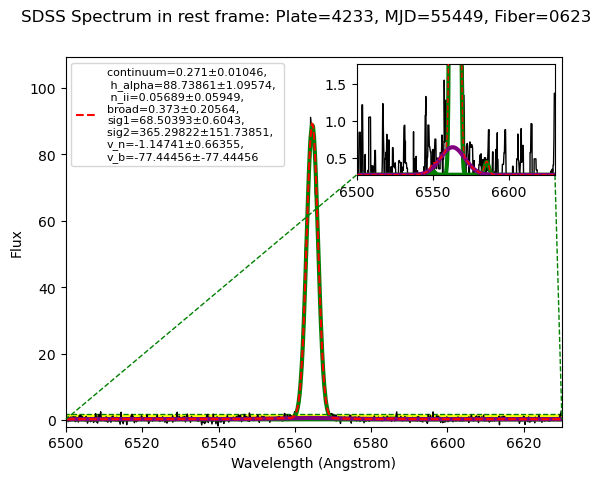

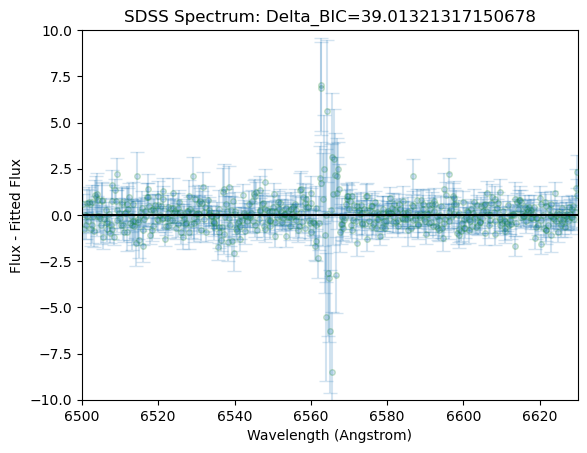

3
4531-55563-0115
12374 13879


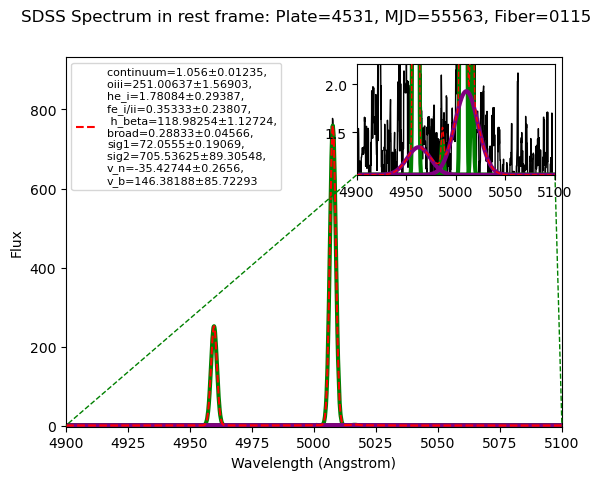

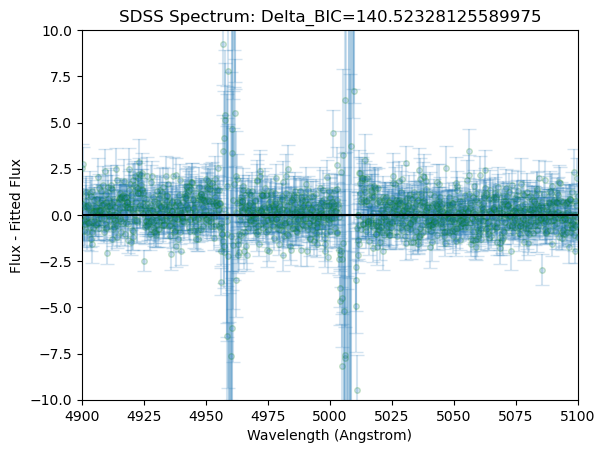

5906 6673


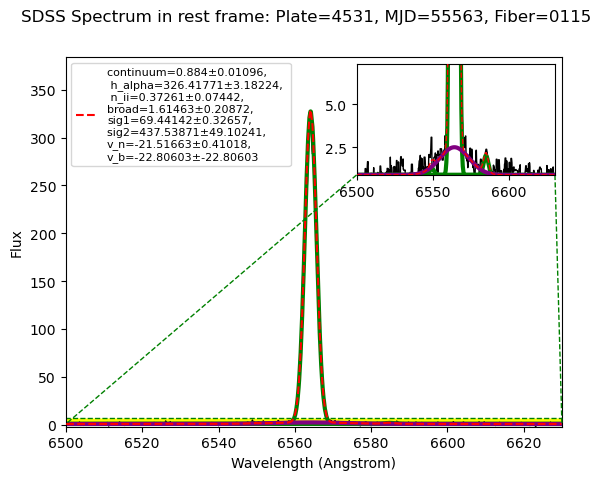

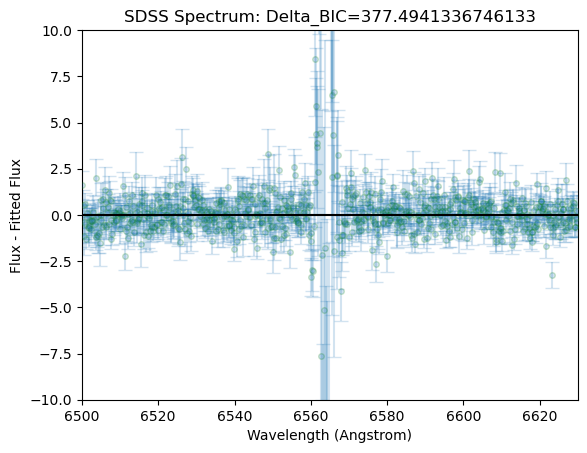

4
5115-55885-0087
10693 12004


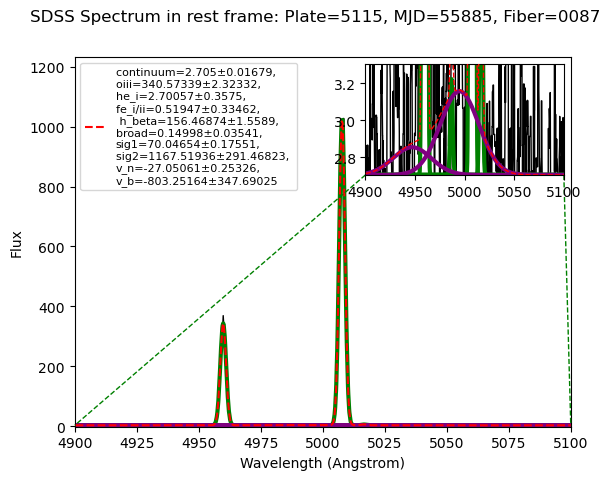

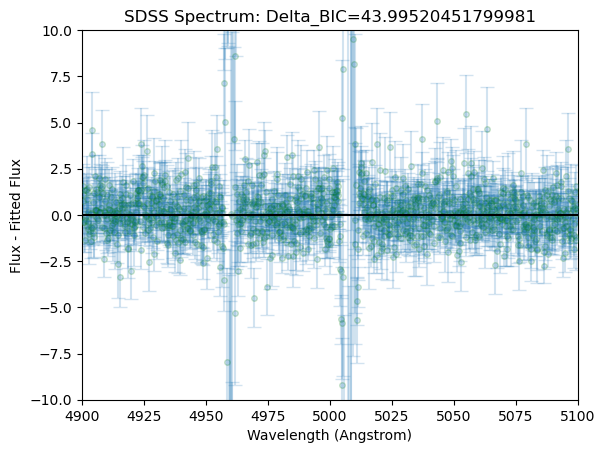

5131 5800


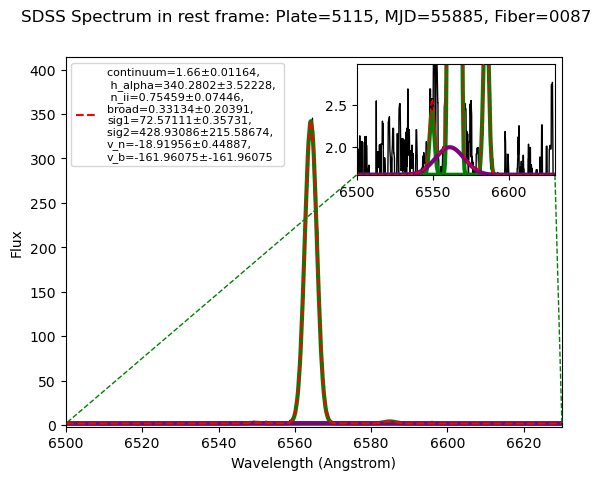

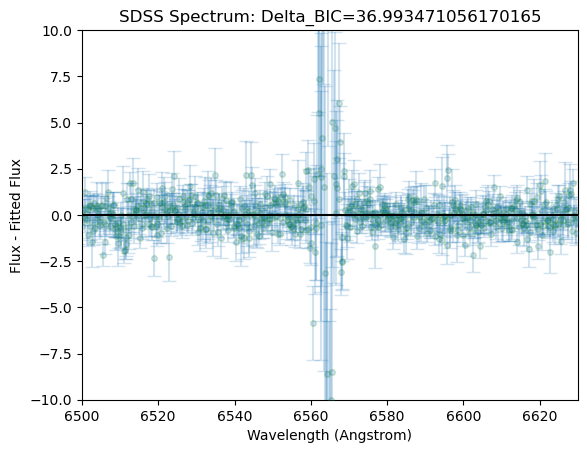

5
6159-56214-0091
7915 8875


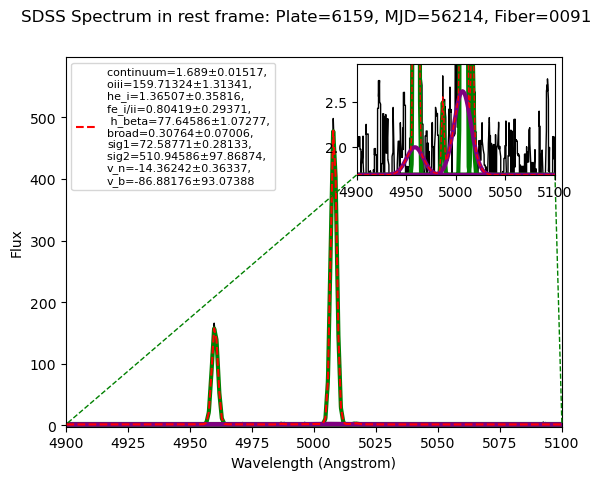

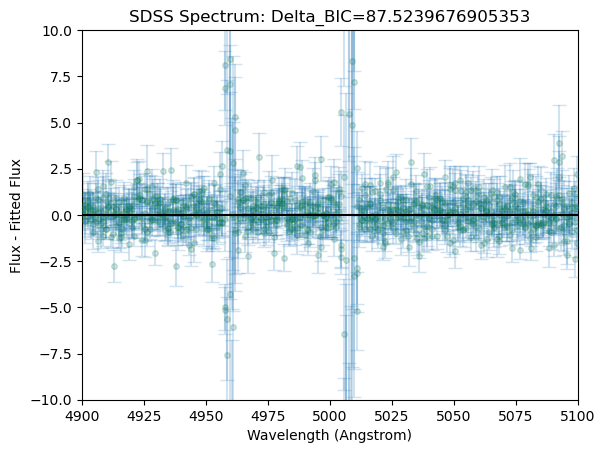

3950 4430


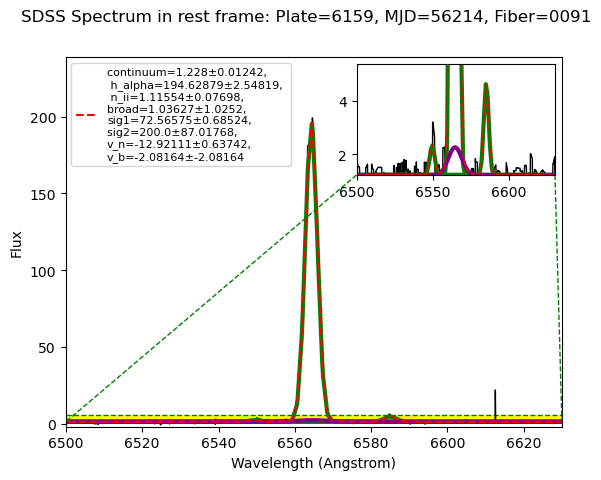

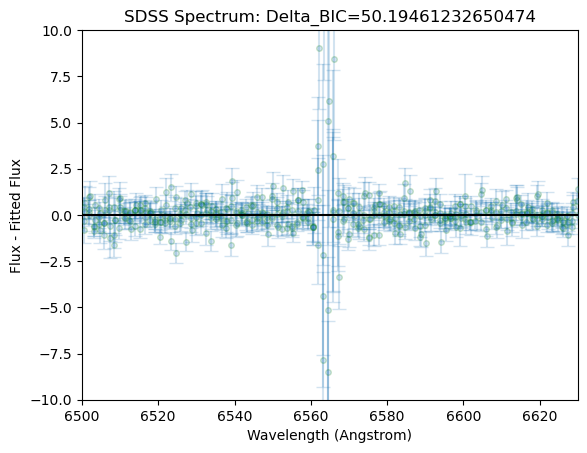

6
6641-56383-0398
13943 15642


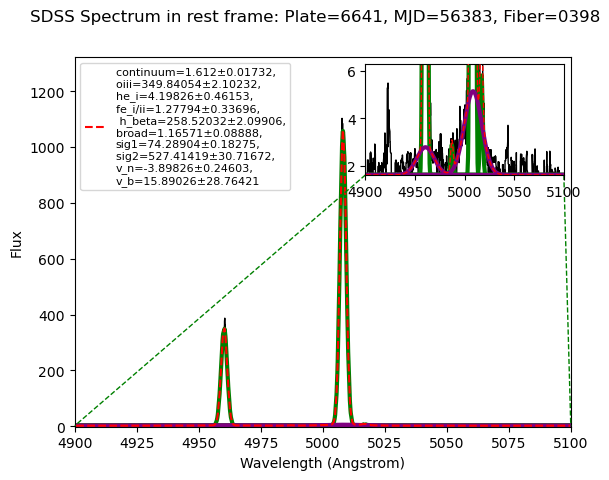

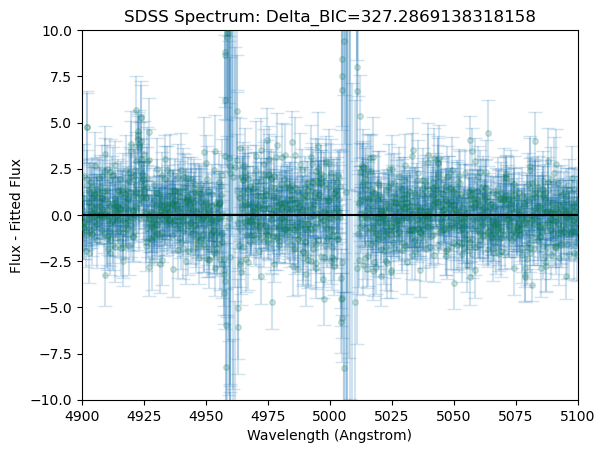

6780 7645


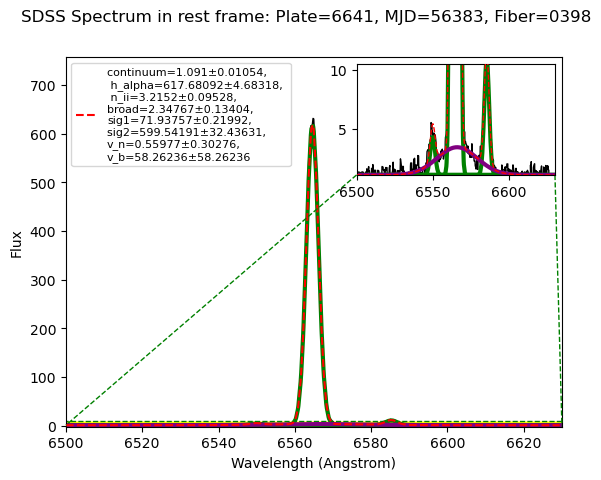

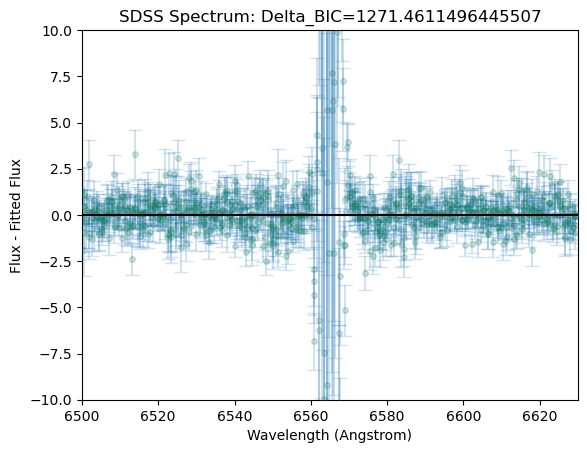

7
6656-56624-0622
4233 4780


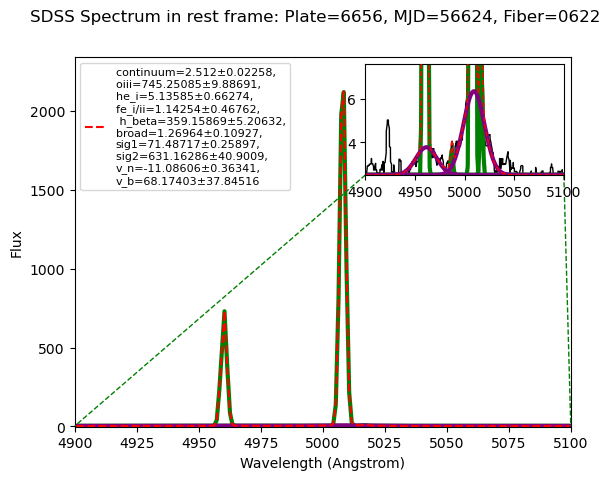

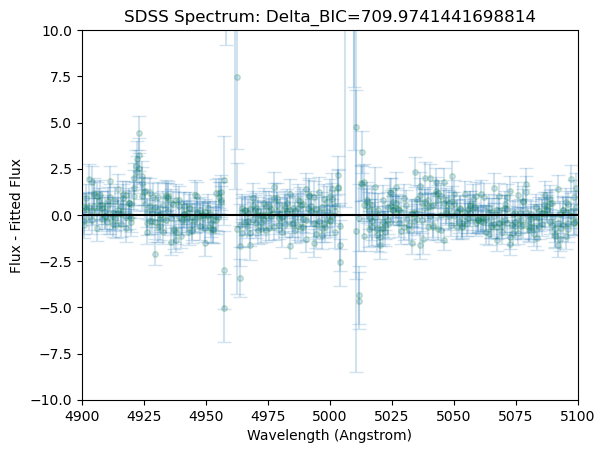

1902 2176


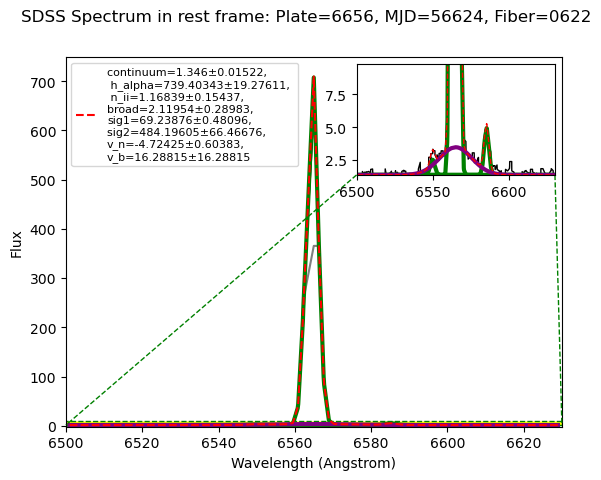

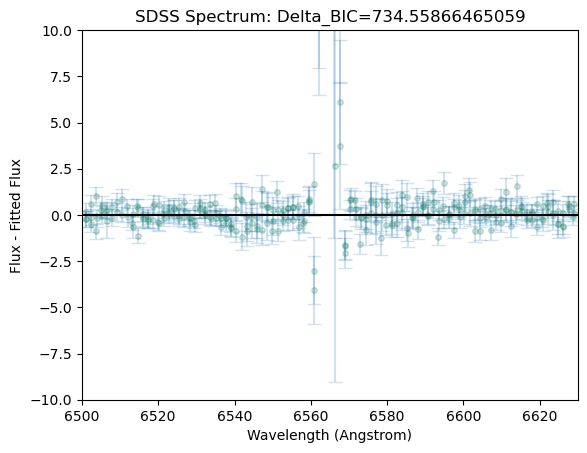

8
7132-56565-0949
9298 10446


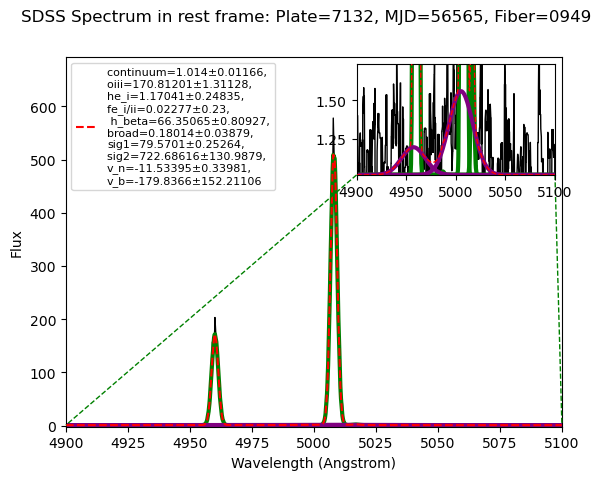

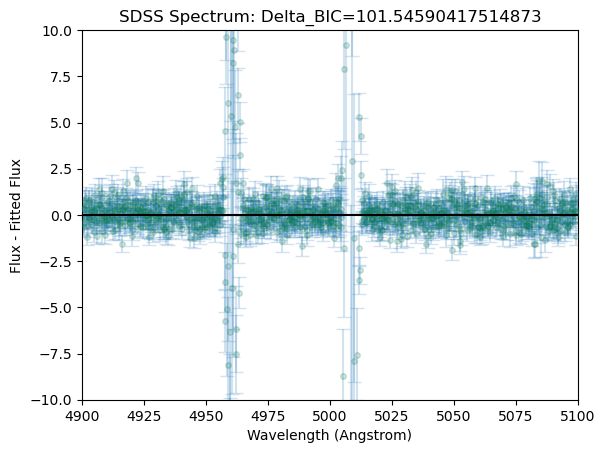

4788 5378


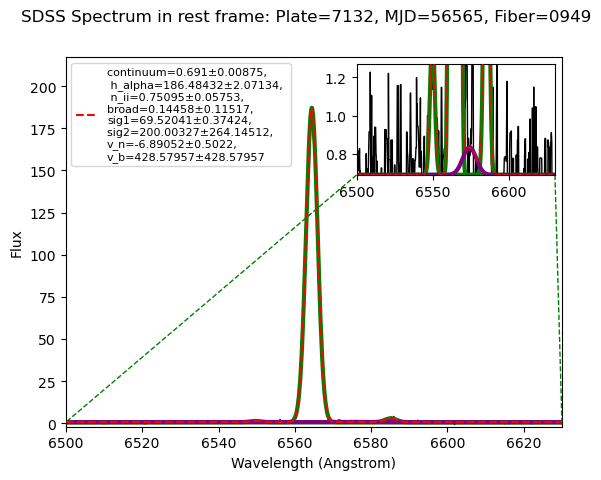

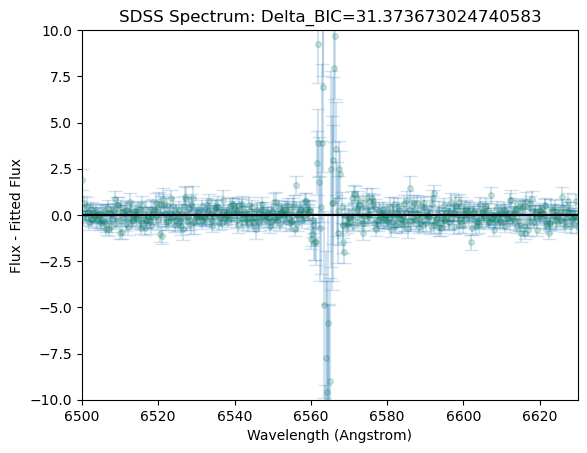

9
7315-56685-0165
8670 9784


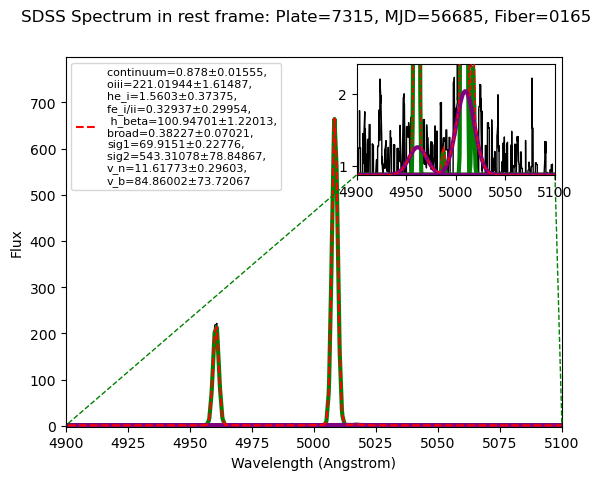

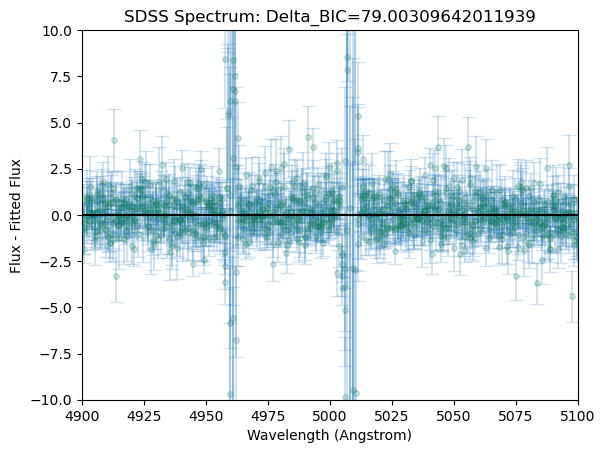

3954 4524


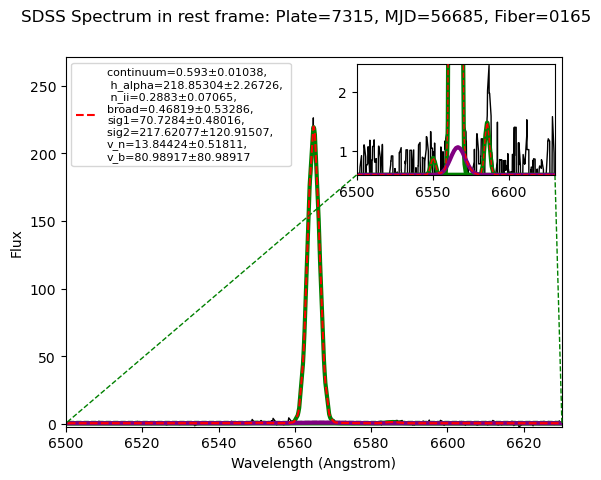

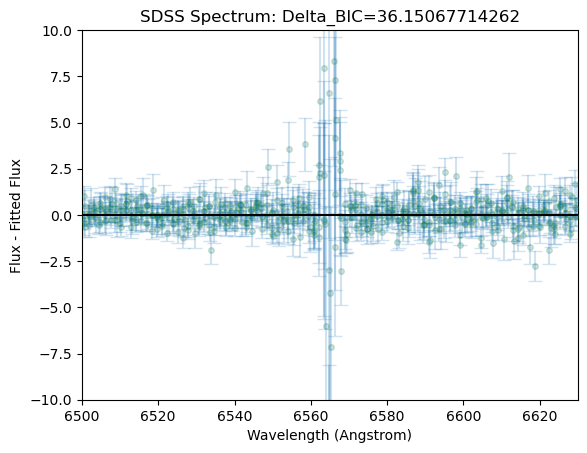

10
7417-56753-0076
9483 10499


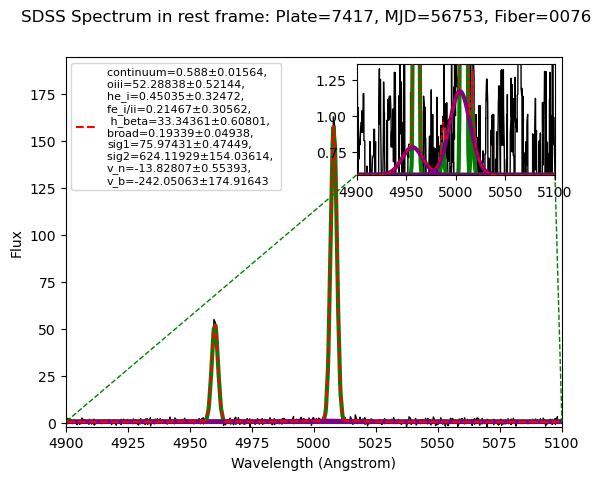

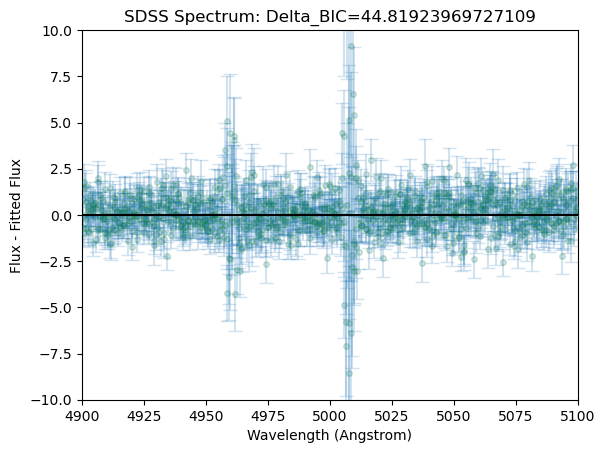

5692 6207


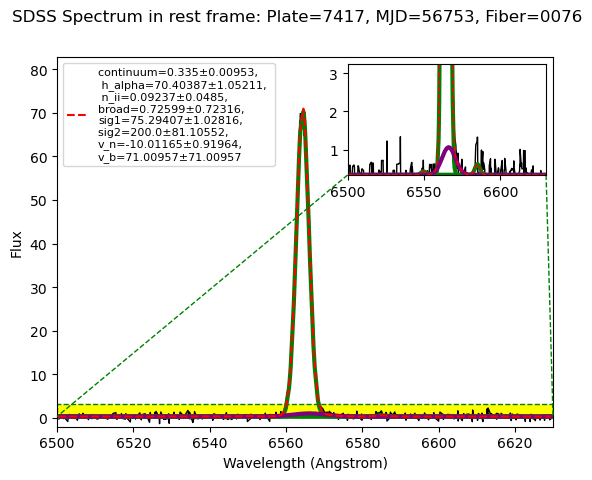

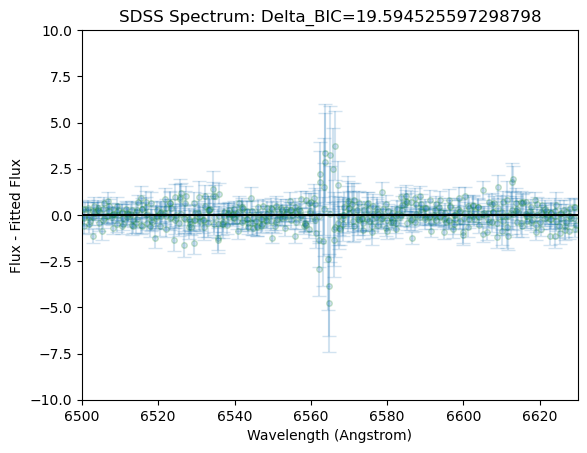

11
7645-57573-0276
4629 5199


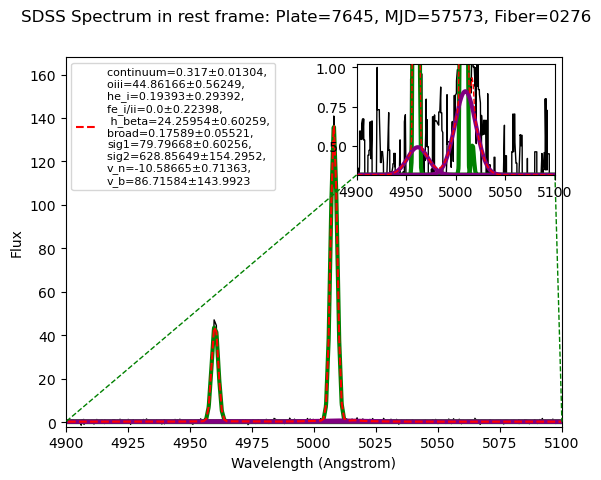

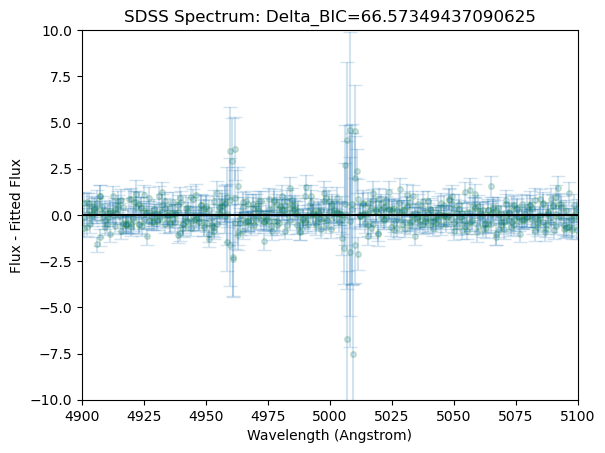

2328 2618


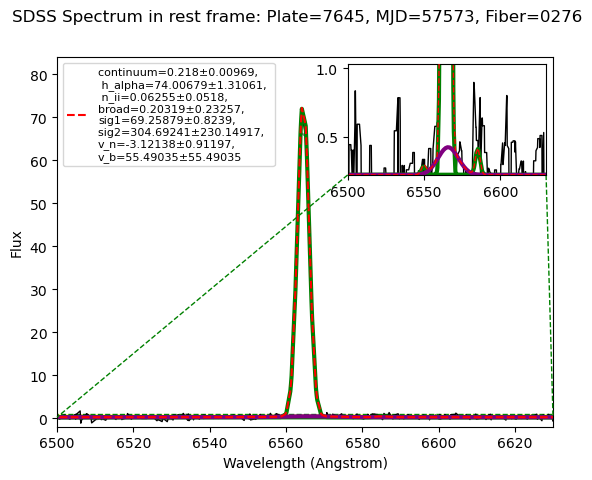

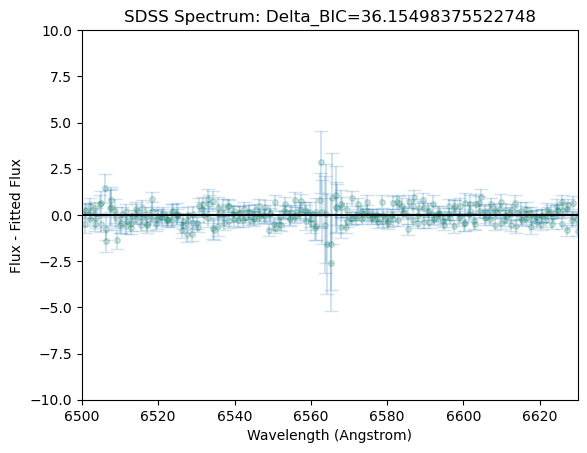

12
7876-57002-0720
4583 5378


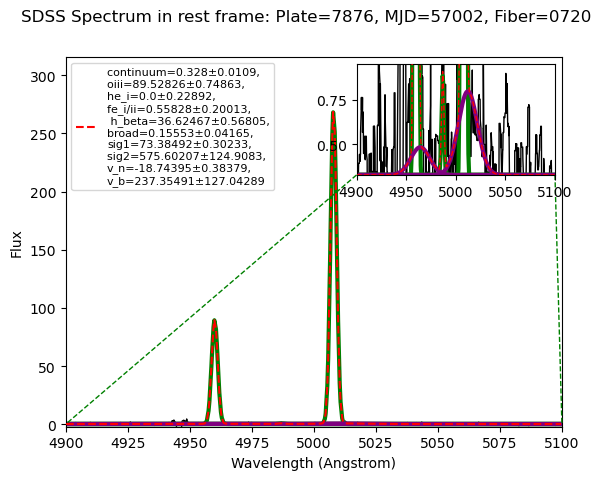

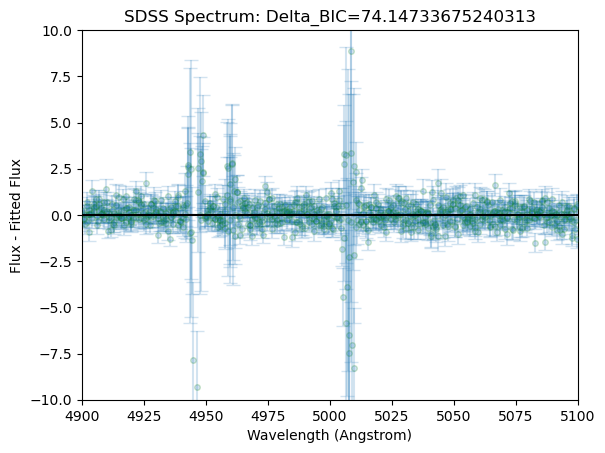

4129 4537


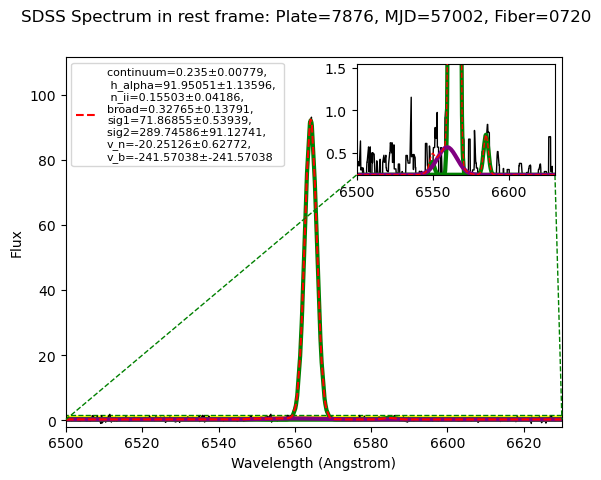

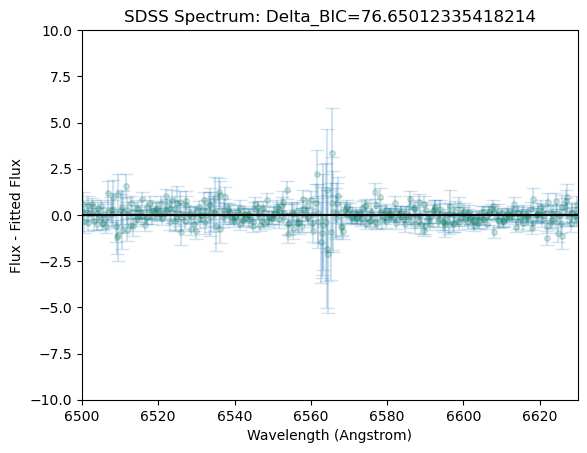

13
8394-57865-0562
9705 10872


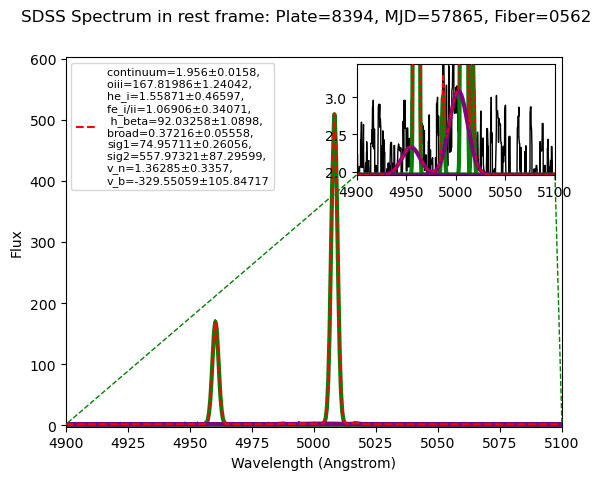

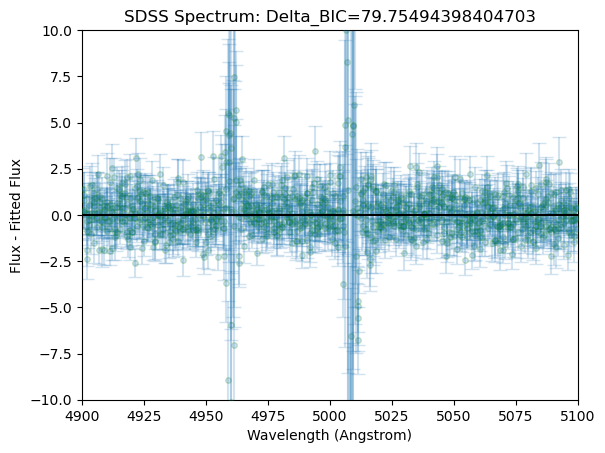

5174 5771


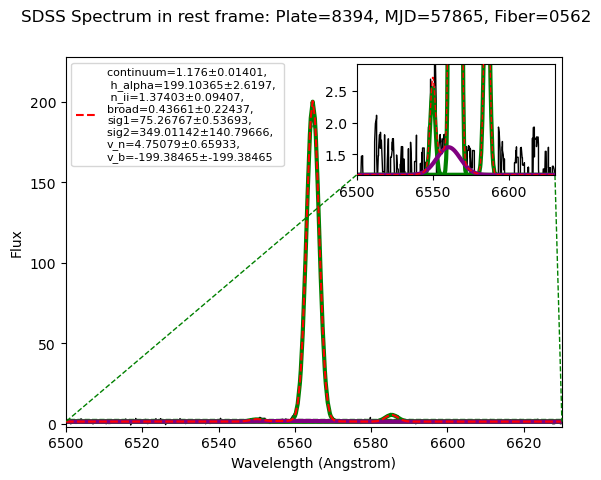

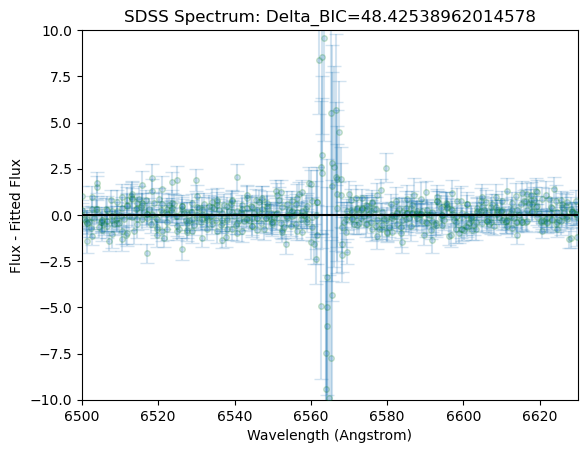

14
8500-57432-0828
11070 12557


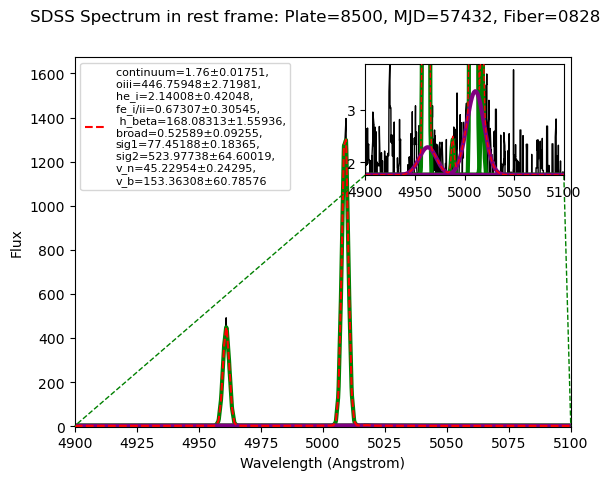

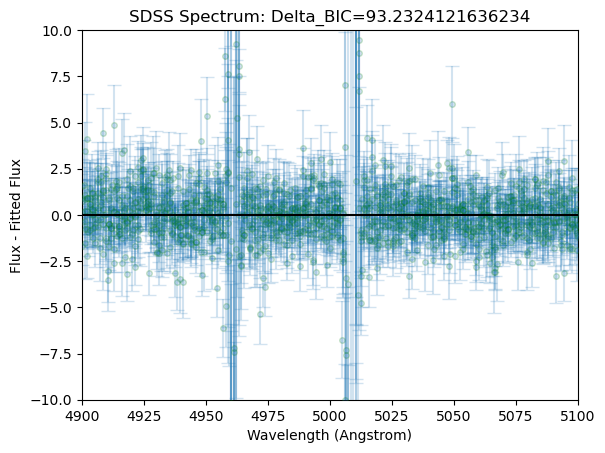

4922 5677


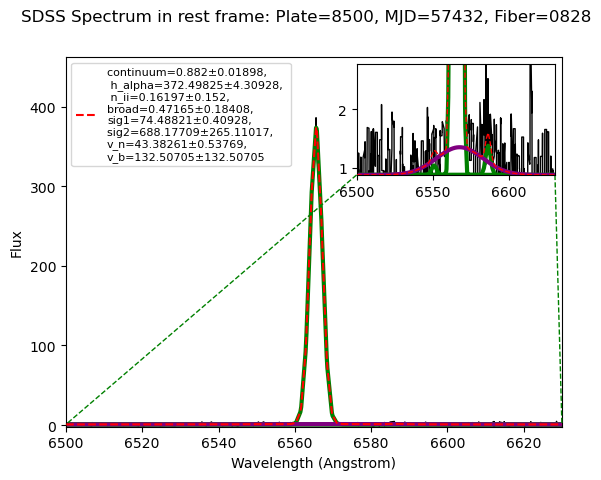

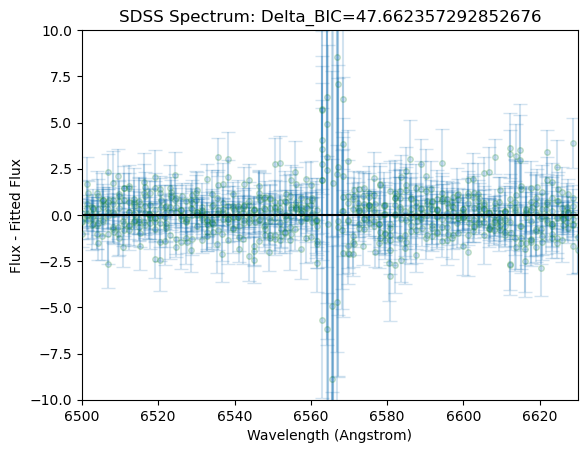

15
10665-58456-0651
8855 9972


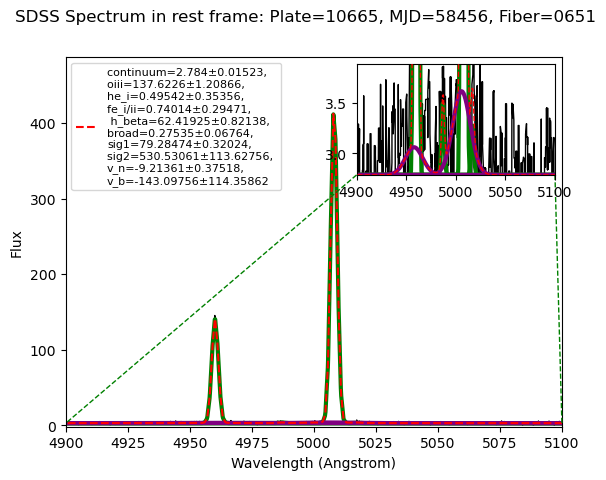

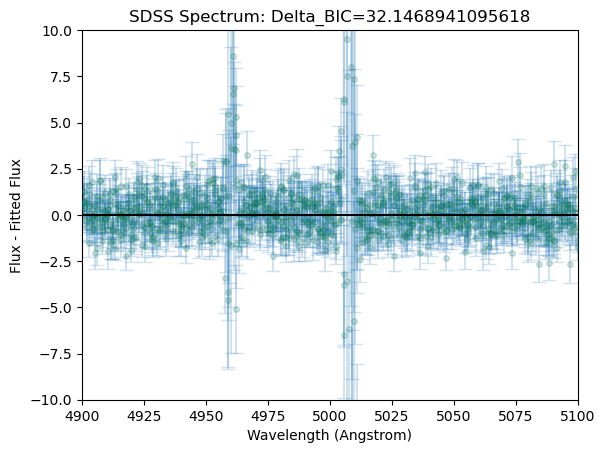

4141 4714


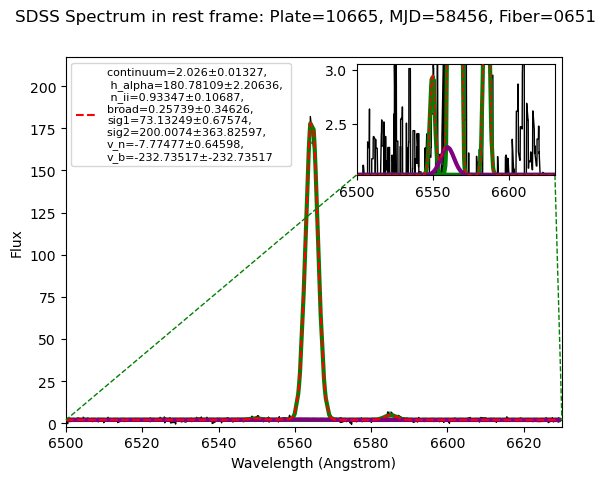

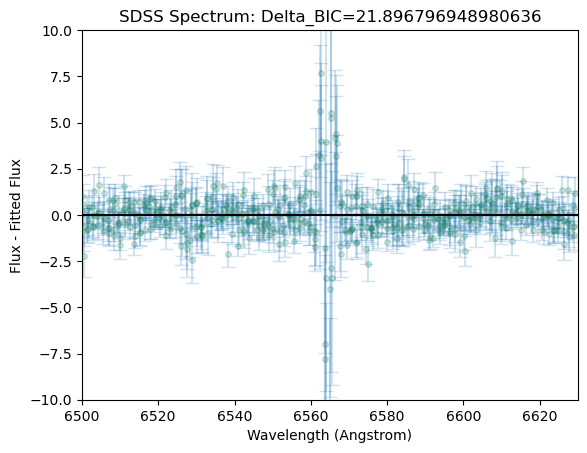

16
10733-58244-0245
9729 11024


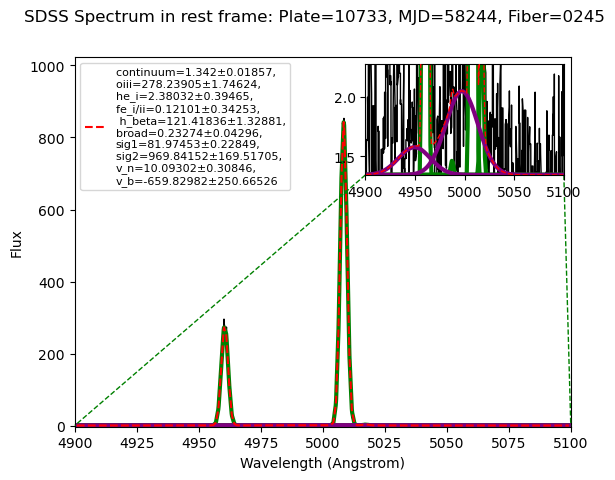

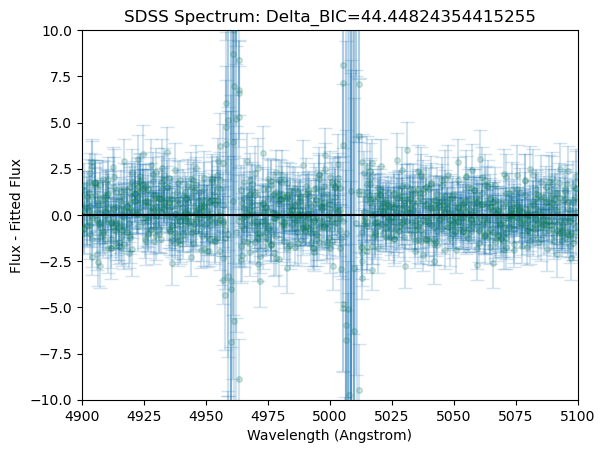

4523 5183


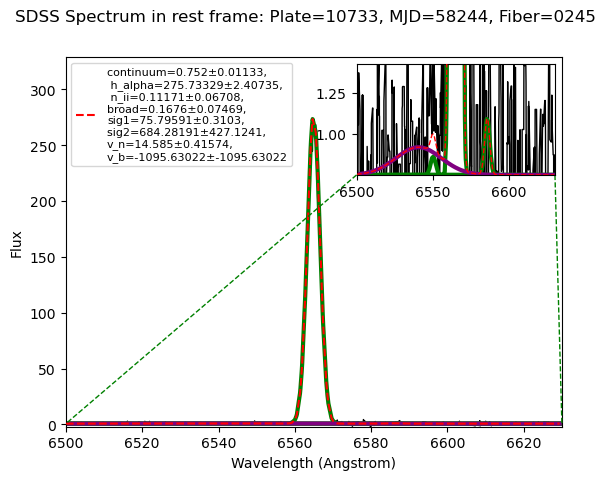

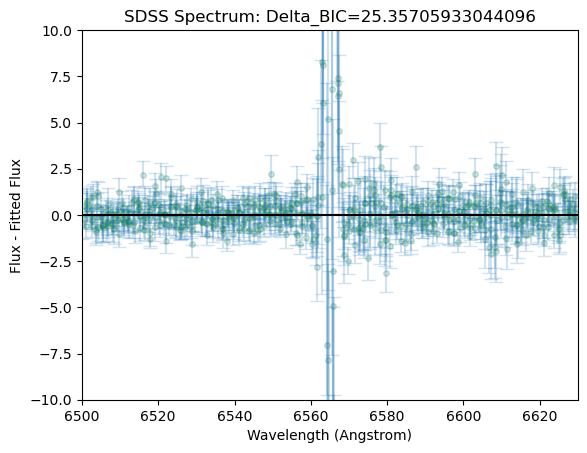

17
11067-58507-0597
7079 8009


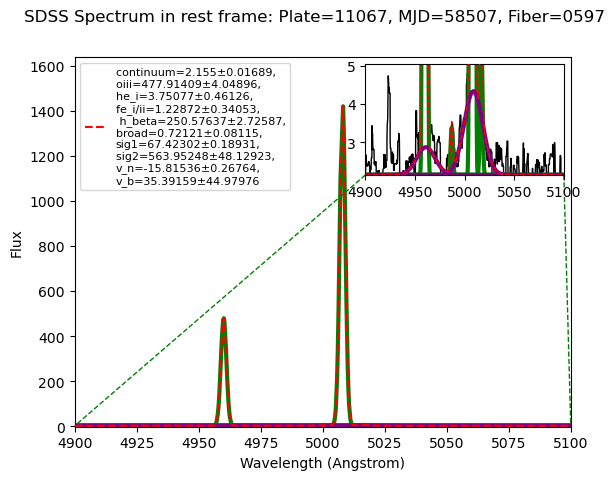

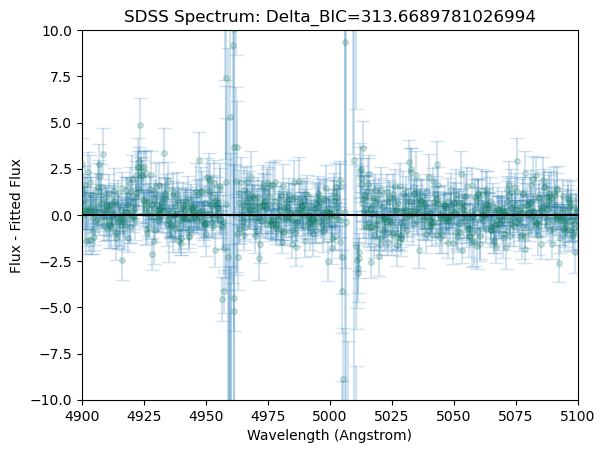

3144 3612


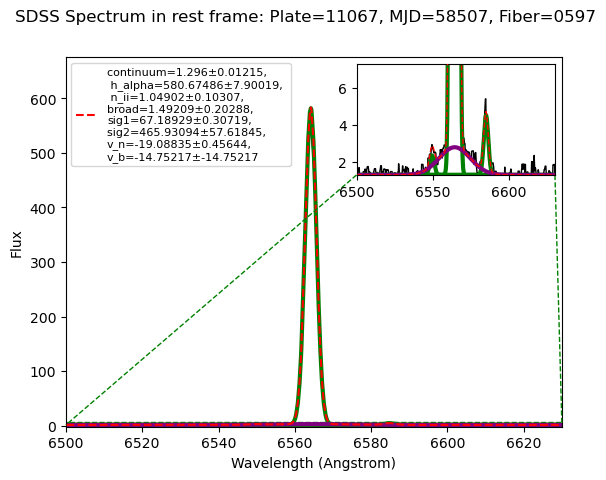

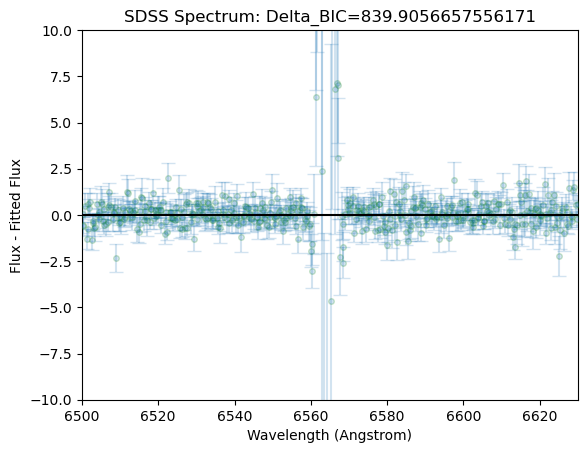

0


In [150]:
plate_list = []
mjd_list  = []
fiber_list  = []

for i in range(len(selection)):
    print(i)
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    gal_nobroad = galaxy_data_nobroad[(galaxy_data_nobroad['plate']==int(plate)) & (galaxy_data_nobroad['mjd']==int(mjd))&(galaxy_data_nobroad['fiber']==int(fiber))]
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    print(plate + "-" + mjd+ "-"+ fiber)
    fits_directory = "C:/Users/nihad/pipelines/"

    # Define the name of your FITS file
    fits_filename = "spec-"+plate+"-"+mjd+"-"+fiber+".fits"
    
    # Construct the full path to the FITS file
    fits_path = os.path.join(fits_directory, fits_filename)
    spec_hdu = fits.open(fits_path, memmap=True)
    z = spec_hdu[2].data["z"]
    spec_data = spec_hdu[1].data
    header = spec_hdu[0].header

    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 4900)[0][0]
    max = np.where(np.array(sorted_wave) > 5100)[0][0]
    print(min, max)

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_oiii(ranged_wave, gal["oiii_continuuum"], gal['oiii'], gal['he_i'], gal['fe_i/ii'], gal['h_beta'], gal['broad_oiii'], gal['sigma1_oiii'], gal['sigma2_oiii'], gal['v_n_oiii'], gal['v_b_oiii'])

    #Plots the gaussian with the fits
    fig, ax = plt.subplots()
    plt.plot(ranged_wave, ranged_flux, '-',color = 'black',linewidth=1)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(gal["oiii_continuuum"],3)}±{round(gal["oiii_continuuum_err"],5)}, \noiii={round(gal['oiii'],5)}±{round(gal['oiii_err'],5)}, \nhe_i={round(gal['he_i'],5)}±{round(gal['he_i_err'],5)}, \nfe_i/ii={round(gal['fe_i/ii'],5)}±{round(gal['fe_i/ii_err'],5)}, \n h_beta={round(gal['h_beta'],5)}±{round(gal['h_beta_err'],5)},\nbroad={round(gal['broad_oiii'],5)}±{round(gal['broad_oiii_err'],5)},\nsig1={round(gal['sigma1_oiii'],5)}±{round(gal['sigma1_oiii_err'],5)},\nsig2={round(gal['sigma2_oiii'],5)}±{round(gal['sigma2_oiii_err'],5)}, \nv_n={round(gal['v_n_oiii'],5)}±{round(gal['v_n_oiii_err'],5)},\nv_b={round(gal['v_b_oiii'],5)}±{round(gal['v_b_oiii_err'],5)}", zorder=3)
    plt.plot(ranged_wave, o_iii_1(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, o_iii_2(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, he_i(ranged_wave, gal['he_i'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, fe(ranged_wave, gal['fe_i/ii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, h_beta(ranged_wave, gal['h_beta'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, broad_1(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    plt.plot(ranged_wave, broad_2(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)

    plt.legend(loc='upper left', fontsize = 8)
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(4900,5100)
    plt.ylim(-2, int(np.max(ranged_flux))+int(np.max(ranged_flux))/5)

    
    inset = inset_axes(ax, width='40%', height='30%', loc='upper right',)
    inset.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=9), '-',color = 'black',linewidth=1)
    inset.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1, zorder=3)
    inset.plot(ranged_wave, o_iii_1(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, o_iii_2(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, he_i(ranged_wave, gal['he_i'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, fe(ranged_wave, gal['fe_i/ii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, h_beta(ranged_wave, gal['h_beta'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, broad_1(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    inset.plot(ranged_wave, broad_2(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    inset.set_xlim(4900,5100)
    inset.set_ylim(gal["oiii_continuuum"], gal["oiii_continuuum"]+4*gal['broad_oiii'])
    mark_inset(ax, inset, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

    
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oiii.png")
    plt.show()

    fit_y_nobroad = Gauss_oiii_no_broad(ranged_wave, gal_nobroad["oiii_continuuum_nobroad"], gal_nobroad['oiii_nobroad'], gal_nobroad['he_i_nobroad'], gal_nobroad['fe_i/ii_nobroad'], gal_nobroad['h_beta_nobroad'], gal_nobroad['sigma_oiii_nobroad'], gal_nobroad['v_n_oiii_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 10*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 7*np.log(len(ranged_flux))

    uncert = [(1/np.sqrt(item)) for item in ranged_ivar]
    plt.errorbar(ranged_wave, err, yerr = uncert, fmt='o',markersize=4, zorder=2.5, capsize=5,alpha = 0.2, markeredgecolor="green", label='Data')
    plt.axhline(y = 0, zorder = 3, color='black')
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux - Fitted Flux")
    plt.title(f"SDSS Spectrum: Delta_BIC={BIC_nobroad-BIC}")
    plt.xlim(4900,5100)
    plt.ylim(-10, 10)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oiii_residuals.png")
    
    plt.show()
    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 6500)[0][0]
    max = np.where(np.array(sorted_wave) > 6630)[0][0]
    print(min, max)

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_h_alpha(ranged_wave, gal["h_continuuum"], gal['h'], gal['n_ii'], gal['broad_h'], gal['sigma1_h'], gal['sigma2_h'], gal['v_n_h'], gal['v_b_h'])
    
    #Plots the gaussian with the fits
    fig, ax = plt.subplots()
    plt.plot(ranged_wave, ranged_flux, '-',color = 'black',linewidth=1)
    plt.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1.5, alpha = 0.5)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(gal["h_continuuum"],3)}±{round(gal["h_continuuum_err"],5)}, \n h_alpha={round(gal['h'],5)}±{round(gal['h_err'],5)}, \n n_ii={round(gal['n_ii'],5)}±{round(gal['n_ii_err'],5)}, \nbroad={round(gal['broad_h'],5)}±{round(gal['broad_h_err'],5)},\nsig1={round(gal['sigma1_h'],5)}±{round(gal['sigma1_h_err'],5)},\nsig2={round(gal['sigma2_h'],5)}±{round(gal['sigma2_h_err'],5)}, \nv_n={round(gal['v_n_h'],5)}±{round(gal['v_n_h_err'],5)},\nv_b={round(gal['v_b_h'],5)}±{round(gal['v_b_h'],5)}", zorder=3)
    plt.plot(ranged_wave, h_alpha(ranged_wave, gal['h'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_1(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_2(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, broad(ranged_wave, gal['broad_h'], gal['sigma2_h'], gal['v_b_h'])+gal["h_continuuum"], '-',color = 'purple',linewidth=3)

    
    plt.legend(loc='upper left', fontsize = 8)
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(6500, 6630)
    plt.ylim(-2, int(np.max(ranged_flux))+int(np.max(ranged_flux))/5)

    
    inset = inset_axes(ax, width='40%', height='30%', loc='upper right',)
    inset.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1)
    inset.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1, zorder=3)
    inset.plot(ranged_wave, h_alpha(ranged_wave, gal['h'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, n_ii_1(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, n_ii_2(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, broad(ranged_wave, gal['broad_h'], gal['sigma2_h'], gal['v_b_h'])+gal["h_continuuum"], '-',color = 'purple',linewidth=3)
    inset.set_xlim(6500, 6630)
    inset.set_ylim(gal["h_continuuum"], gal["h_continuuum"]+4*gal['broad_h'])
    mark_inset(ax, inset, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

    
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h.png")
    plt.show()

    fit_y_nobroad = Gauss_h_alpha_no_broad(ranged_wave, gal_nobroad["h_continuuum_nobroad"], gal_nobroad['h_nobroad'], gal_nobroad['n_ii_nobroad'], gal_nobroad['sigma_h_nobroad'], gal_nobroad['v_n_h_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 8*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 5*np.log(len(ranged_flux))
    
    uncert = [(1/np.sqrt(item)) for item in ranged_ivar]
    plt.errorbar(ranged_wave, err, yerr = uncert, fmt='o',markersize=4, zorder=2.5, capsize=5,alpha = 0.2, markeredgecolor="green", label='Data')
    plt.axhline(y = 0, zorder = 3, color='black')
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux - Fitted Flux")
    plt.title(f"SDSS Spectrum: Delta_BIC={BIC_nobroad-BIC}")
    plt.xlim(6500, 6630)
    plt.ylim(-10, 10)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_residuals.png")
    plt.show()


print(len(plate_list))

In [151]:
for i in range(len(selection)):
    print(i)
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    gal_nobroad = galaxy_data_nobroad[(galaxy_data_nobroad['plate']==int(plate)) & (galaxy_data_nobroad['mjd']==int(mjd))&(galaxy_data_nobroad['fiber']==int(fiber))]
    
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    print(plate + "-" + mjd+ "-"+ fiber)
    fits_directory = "C:/Users/nihad/pipelines/"

    # Define the name of your FITS file
    fits_filename = "spec-"+plate+"-"+mjd+"-"+fiber+".fits"
    
    # Construct the full path to the FITS file
    fits_path = os.path.join(fits_directory, fits_filename)
    spec_hdu = fits.open(fits_path, memmap=True)
    z = spec_hdu[2].data["z"]
    spec_data = spec_hdu[1].data
    header = spec_hdu[0].header

    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 4900)[0][0]
    max = np.where(np.array(sorted_wave) > 5100)[0][0]

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_oiii(ranged_wave, gal["oiii_continuuum"], gal['oiii'], gal['he_i'], gal['fe_i/ii'], gal['h_beta'], gal['broad_oiii'], gal['sigma1_oiii'], gal['sigma2_oiii'], gal['v_n_oiii'], gal['v_b_oiii'])

    fit_y_nobroad = Gauss_oiii_no_broad(ranged_wave, gal_nobroad["oiii_continuuum_nobroad"], gal_nobroad['oiii_nobroad'], gal_nobroad['he_i_nobroad'], gal_nobroad['fe_i/ii_nobroad'], gal_nobroad['h_beta_nobroad'], gal_nobroad['sigma_oiii_nobroad'], gal_nobroad['v_n_oiii_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 10*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 7*np.log(len(ranged_flux))

    print(BIC_nobroad-BIC)
    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 6500)[0][0]
    max = np.where(np.array(sorted_wave) > 6630)[0][0]
    
    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_h_alpha(ranged_wave, gal["h_continuuum"], gal['h'], gal['n_ii'], gal['broad_h'], gal['sigma1_h'], gal['sigma2_h'], gal['v_n_h'], gal['v_b_h'])

    fit_y_nobroad = Gauss_h_alpha_no_broad(ranged_wave, gal_nobroad["h_continuuum_nobroad"], gal_nobroad['h_nobroad'], gal_nobroad['n_ii_nobroad'], gal_nobroad['sigma_h_nobroad'], gal_nobroad['v_n_h_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 8*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 5*np.log(len(ranged_flux))

    print(BIC_nobroad-BIC)
    
print(len(plate_list))

0
3771-55544-0724
72.1064042387734
28.03831711125281
1
3830-55574-0909
58.2427019767797
53.938011100379526
2
4233-55449-0623
120.08267204166009
39.01321317150678
3
4531-55563-0115
140.52328125589975
377.4941336746133
4
5115-55885-0087
43.99520451799981
36.993471056170165
5
6159-56214-0091
87.5239676905353
50.19461232650474
6
6641-56383-0398
327.2869138318158
1271.4611496445507
7
6656-56624-0622
709.9741441698814
734.55866465059
8
7132-56565-0949
101.54590417514873
31.373673024740583
9
7315-56685-0165
79.00309642011939
36.15067714262
10
7417-56753-0076
44.81923969727109
19.594525597298798
11
7645-57573-0276
66.57349437090625
36.15498375522748
12
7876-57002-0720
74.14733675240313
76.65012335418214
13
8394-57865-0562
79.75494398404703
48.42538962014578
14
8500-57432-0828
93.2324121636234
47.662357292852676
15
10665-58456-0651
32.1468941095618
21.896796948980636
16
10733-58244-0245
44.44824354415255
25.35705933044096
17
11067-58507-0597
313.6689781026994
839.9056657556171
0


In [154]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    imagefound = True
    image1 = Image.open(file1)
    try:
        image2 = Image.open(file2)
    except:
        imagefound = False
    if imagefound:
        (width1, height1) = image1.size
        (width2, height2) = image2.size
    
        result_height = height1 + height2
        result_width = width1
    
        result = Image.new('RGB', (result_width, result_height))
        result.paste(im=image1, box=(0, 0))
        result.paste(im=image2, box=(0, height1))
        return result
    else:
        (width1, height1) = image1.size
    
        result_height = height1 + height1
        result_width = width1
    
        result = Image.new('RGB', (result_width, result_height))
        result.paste(im=image1, box=(0, 0))
        return result
        

for i in range(len(selection)):
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    im1 = plate + "-" + mjd+ "-"+ fiber+"gaussian_oiii.png"      
    im2 = plate + "-" + mjd+ "-"+fiber+"gaussian_oiii_residuals.png"
    merge = merge_images(im1, im2)
    merge.save(str(2*i)+".jpeg")
    im1 = plate + "-" + mjd+ "-"+ fiber+"gaussian_h.png"        
    im2 = plate + "-" + mjd+ "-"+fiber+"gaussian_h_residuals.png"
    merge = merge_images(im1, im2)
    merge.save(str(2*i+1)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(len(selection)*2):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)    
pdf.output("Gaussian_graphs_oiii.pdf")

In [156]:
selection = galaxy_data[((galaxy_data['sigma2_h']/galaxy_data['sigma2_h_err'])>4) & (np.round(galaxy_data['broad_h'],5) != 0)
                & (galaxy_data['sigma2_h']>500)& (galaxy_data['sigma2_h']<3999)]
print(len(selection))

10


C:\Users\nihad\AppData\Local\Temp\ipykernel_28060\438740468.py:1: RuntimeWarning: divide by zero encountered in divide
  selection = galaxy_data[((galaxy_data['sigma2_h']/galaxy_data['sigma2_h_err'])>4) & (np.round(galaxy_data['broad_h'],5) != 0)


0
5649-55912-0445
4380 4876


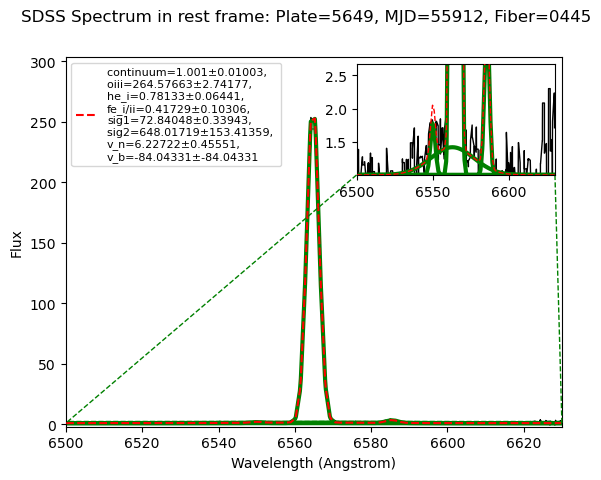

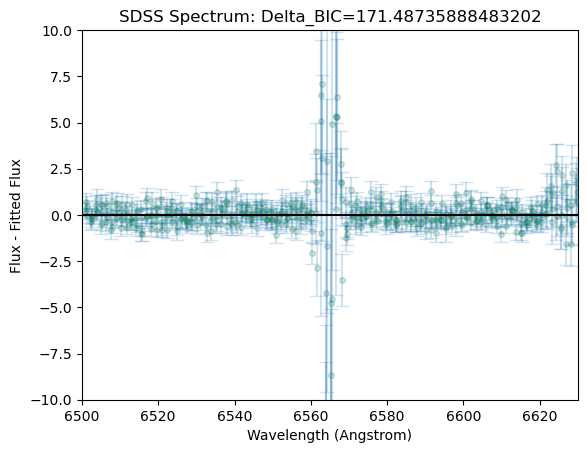

8415 9369


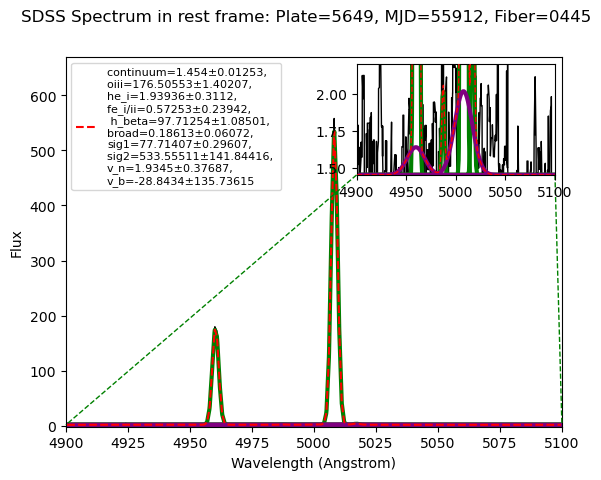

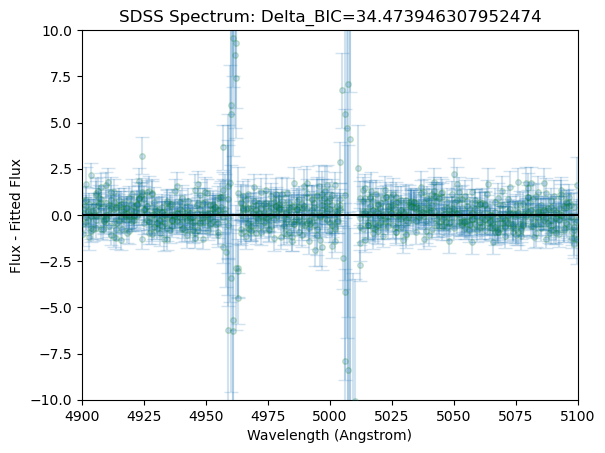

1
6479-56364-0245
2538 2825


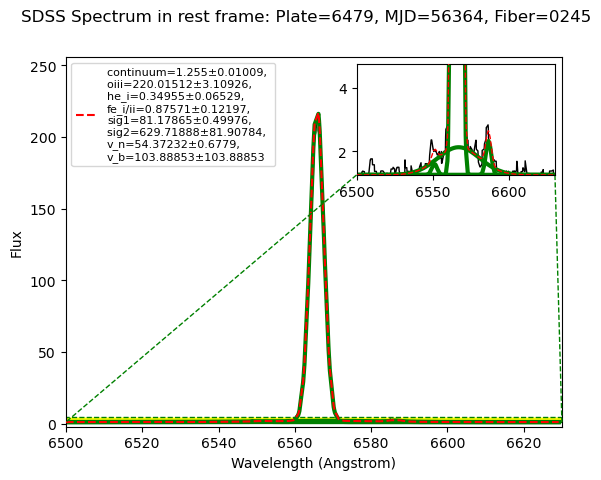

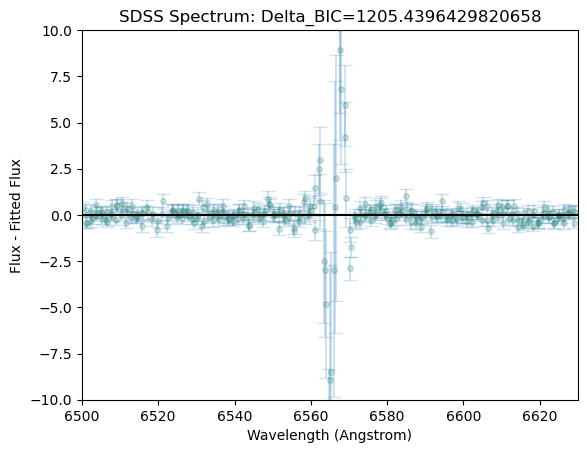

4847 5423


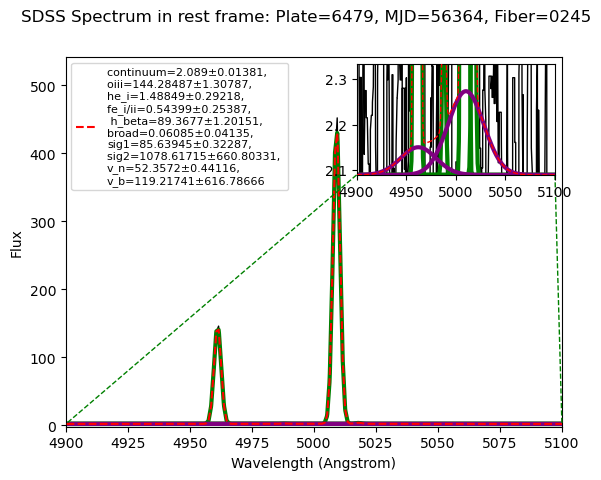

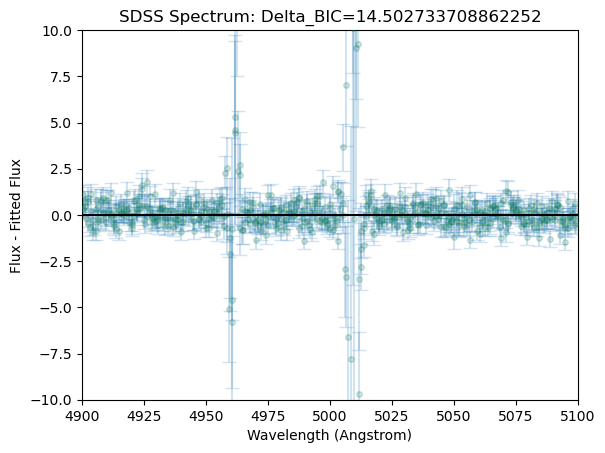

2
6513-56543-0640
2842 3230


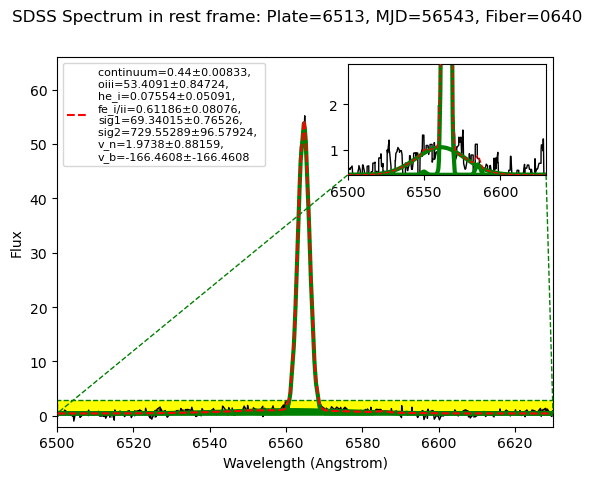

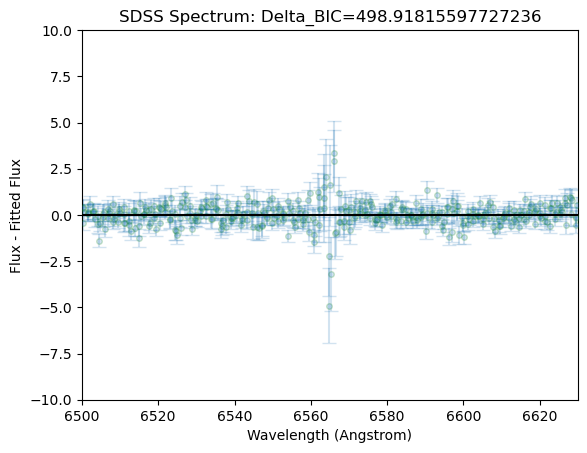

5903 6660


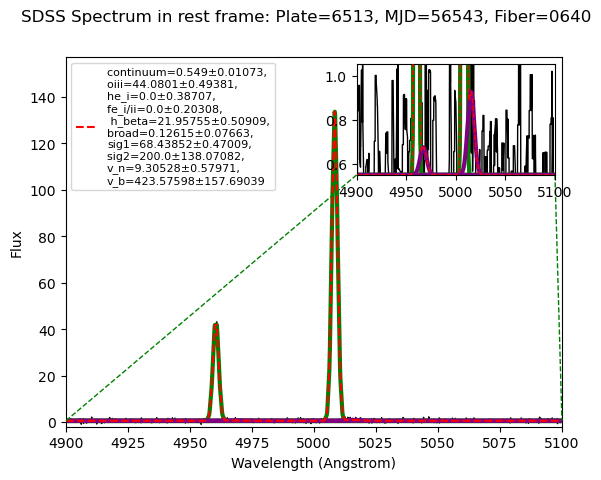

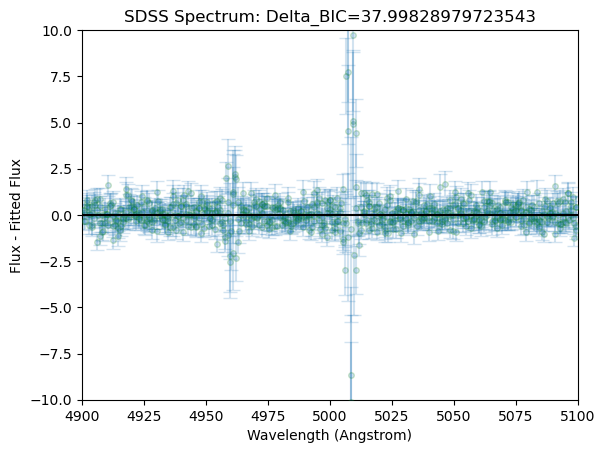

3
6641-56383-0398
6780 7645


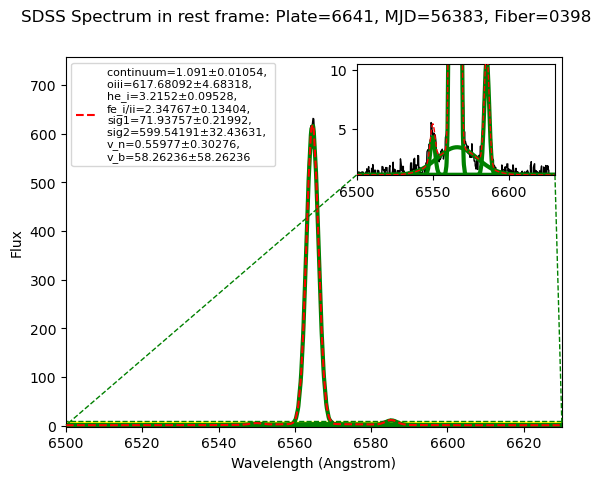

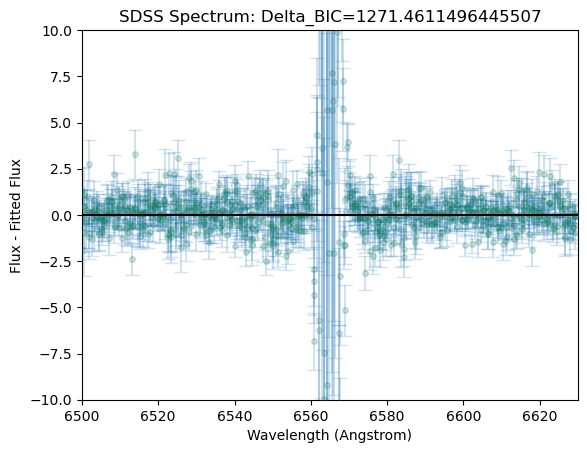

13943 15642


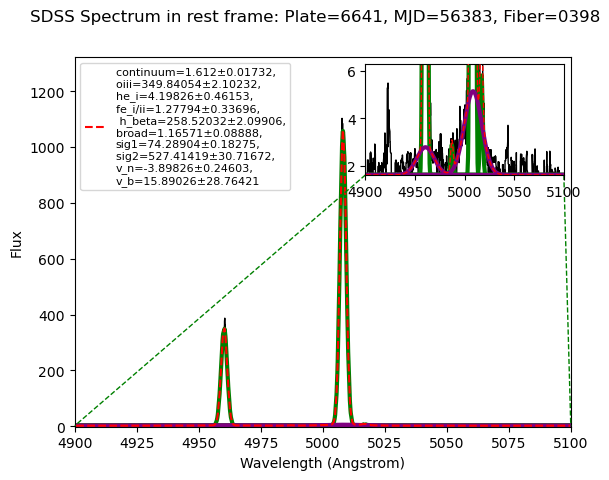

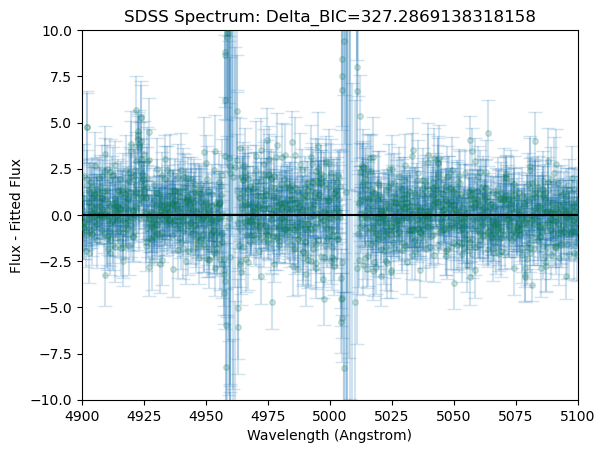

4
7337-56686-0642
8547 9356


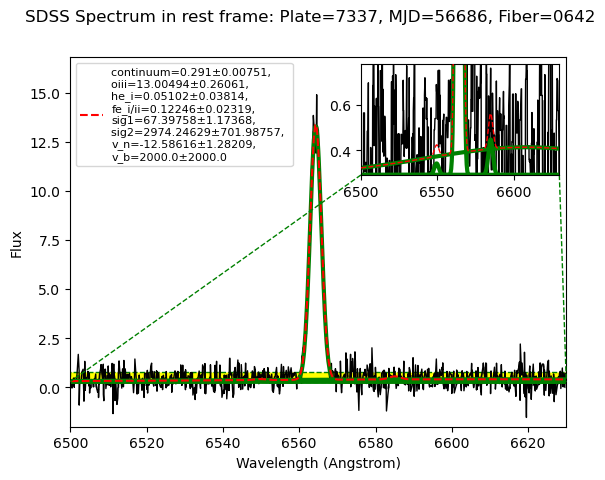

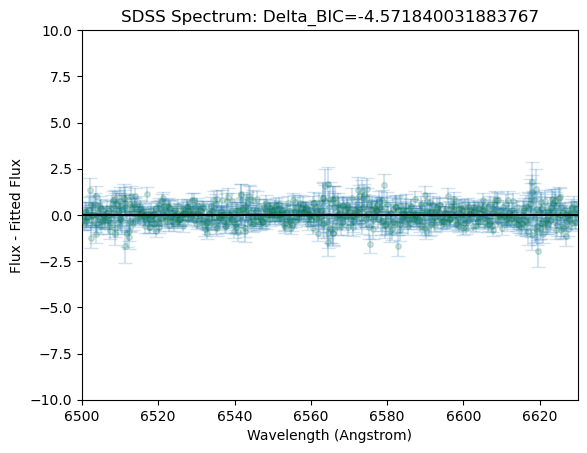

14581 16172


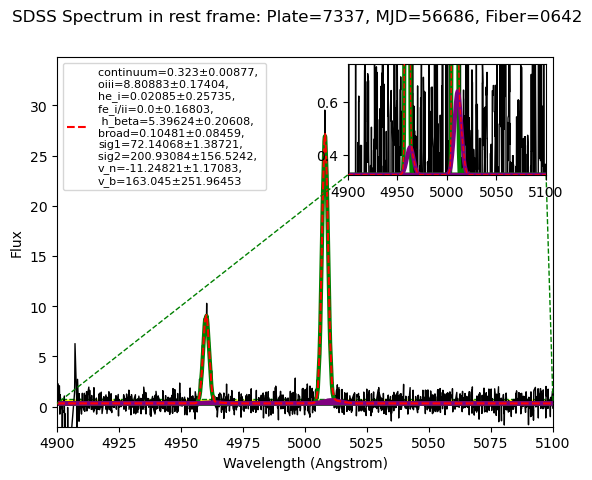

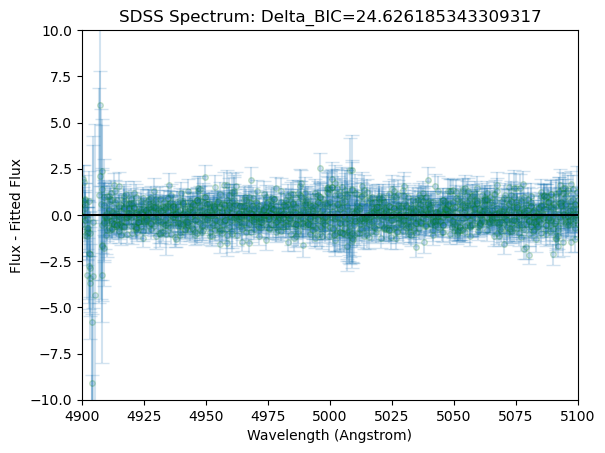

5
7572-56944-0383
2509 2877


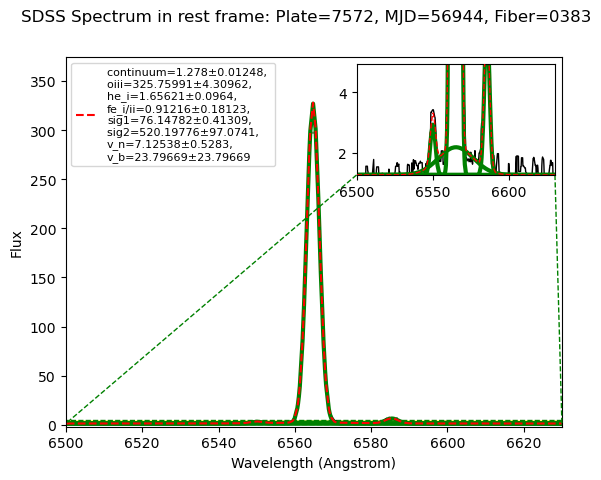

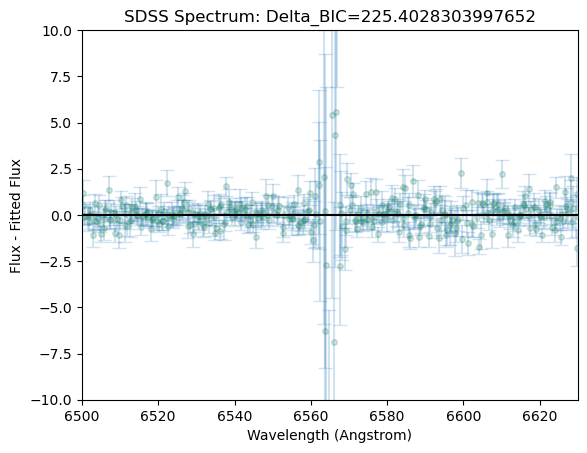

5693 6428


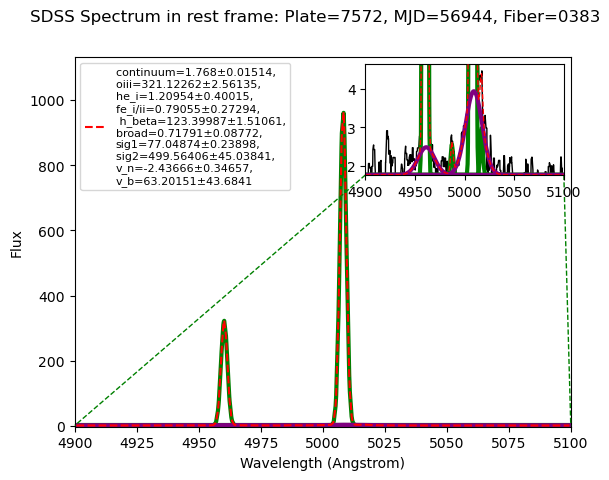

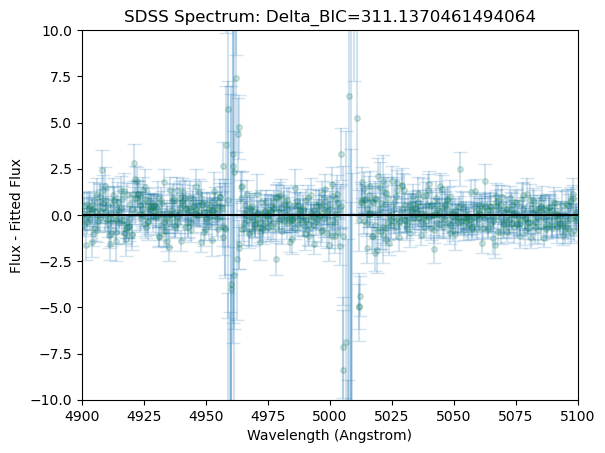

6
7650-57575-0100
4163 4648


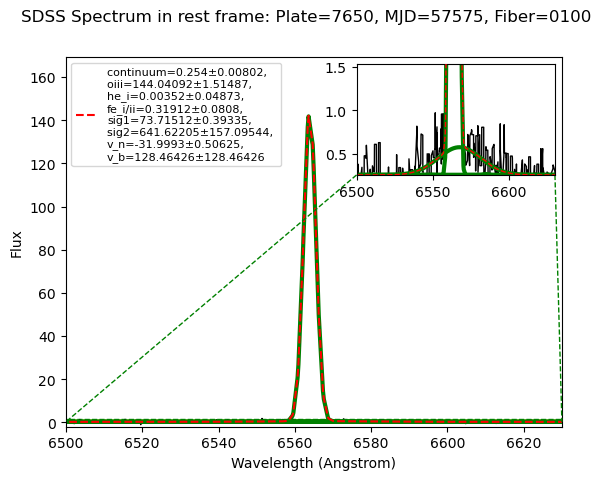

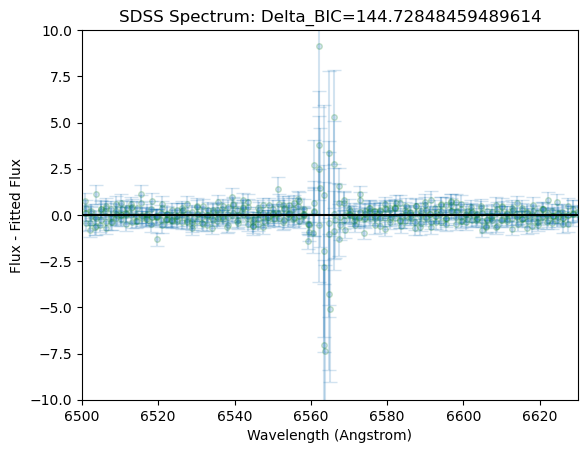

7913 8870


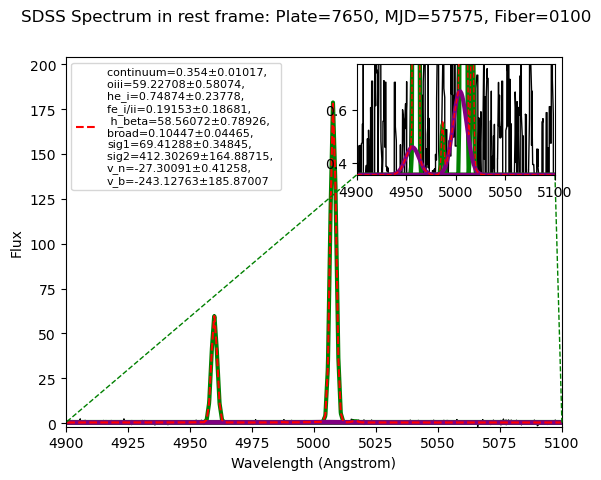

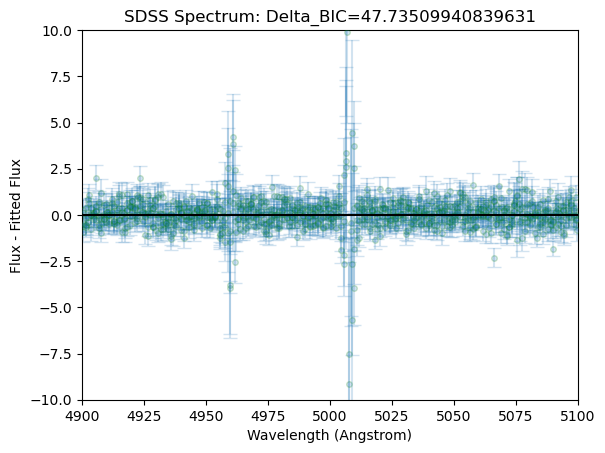

7
7759-58401-0167
4136 4540


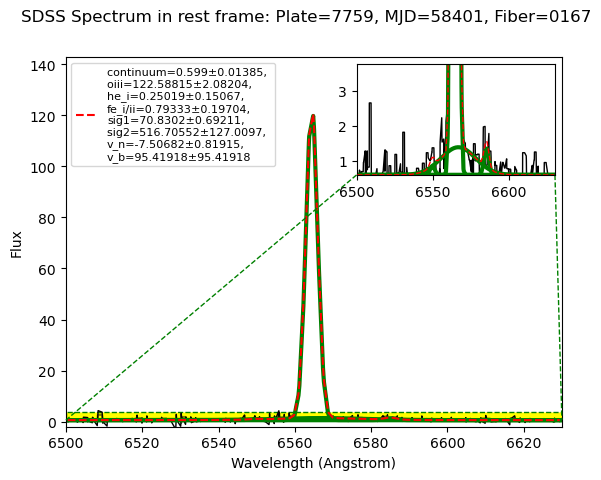

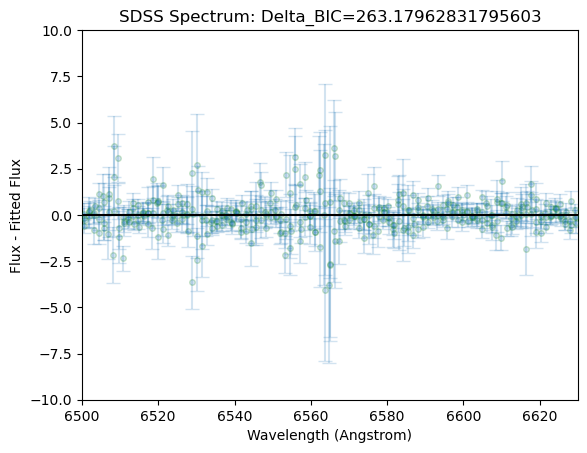

7091 7877


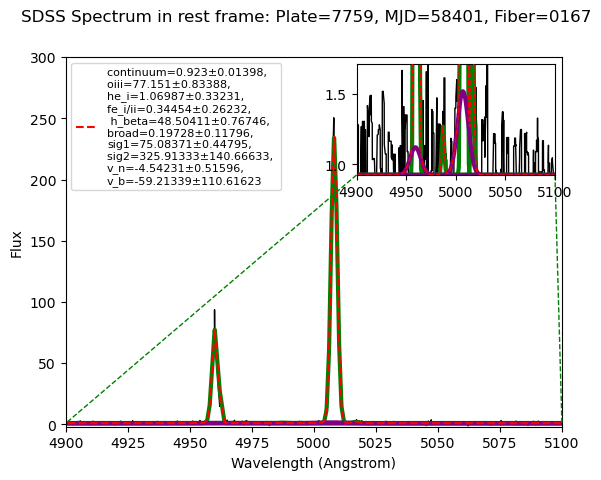

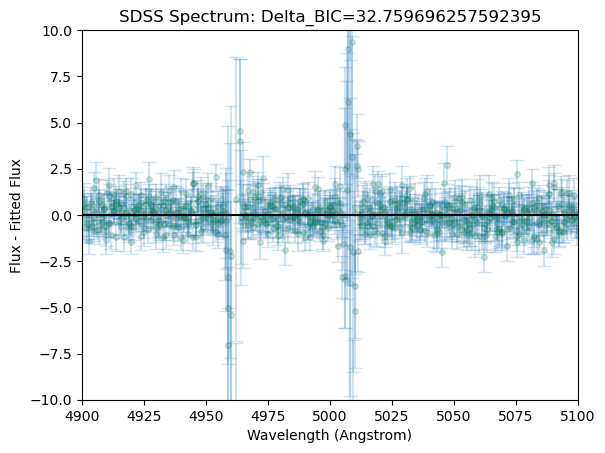

8
7845-56980-0693
4557 5051


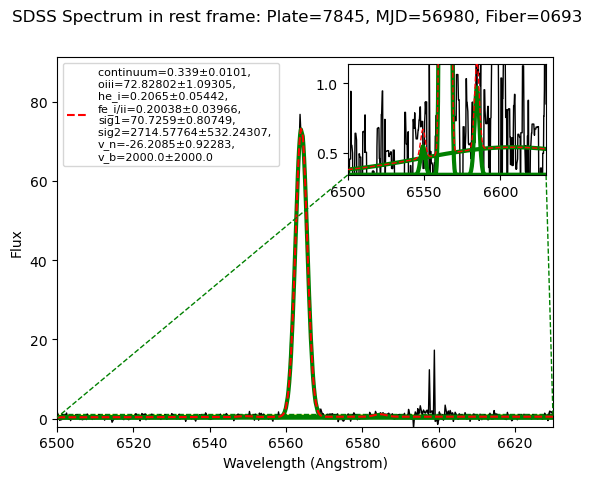

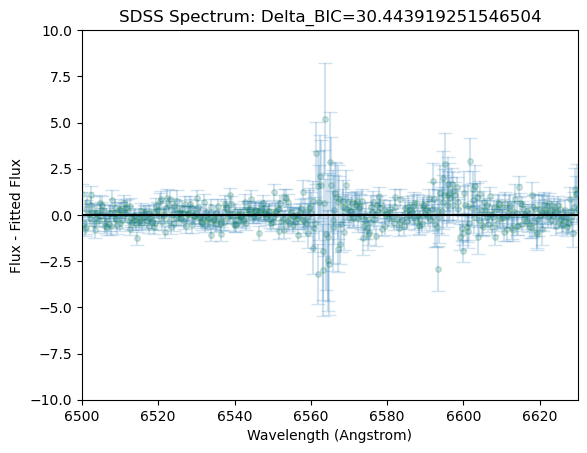

8377 9353


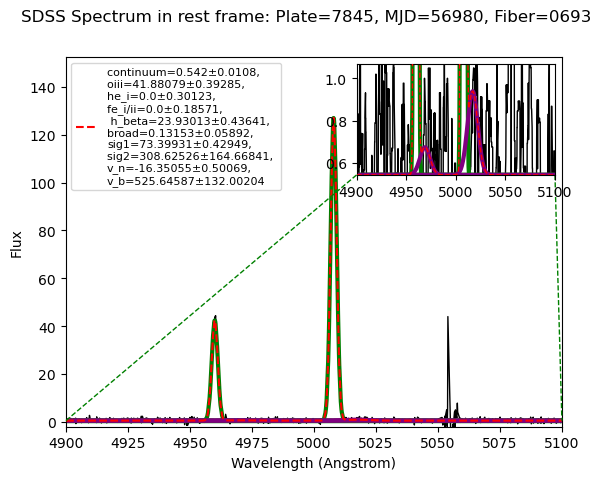

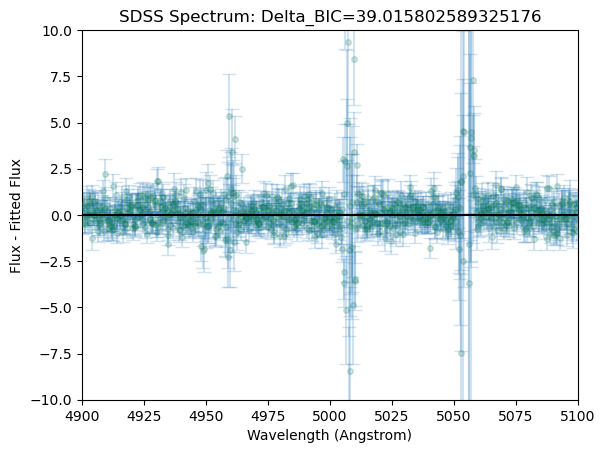

9
8058-57196-0925
4069 4562


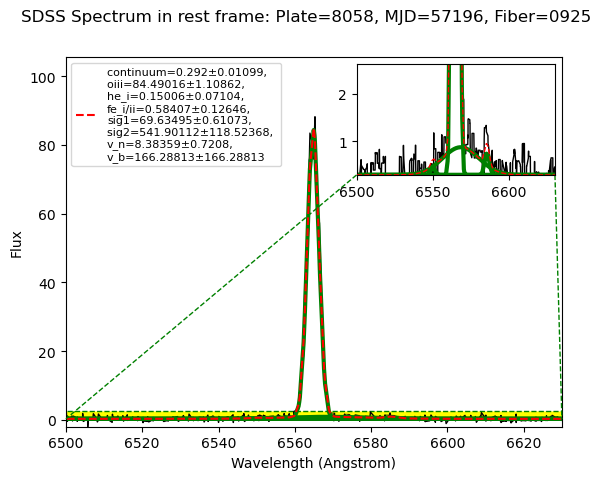

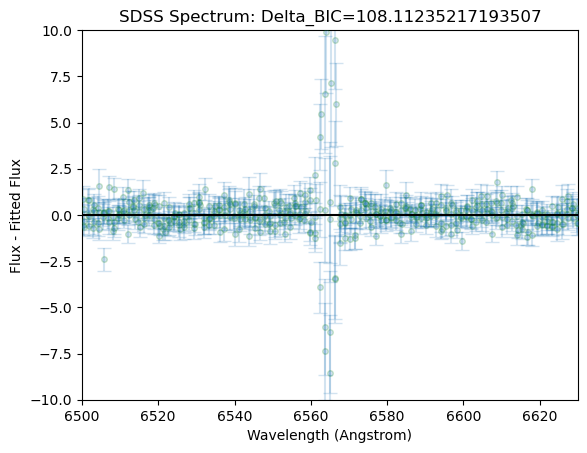

7822 8784


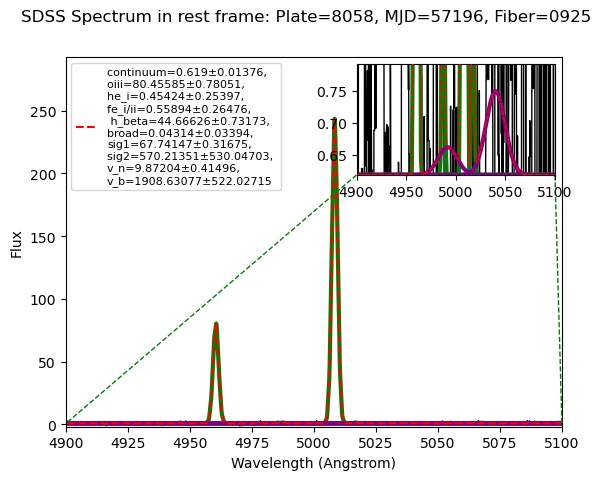

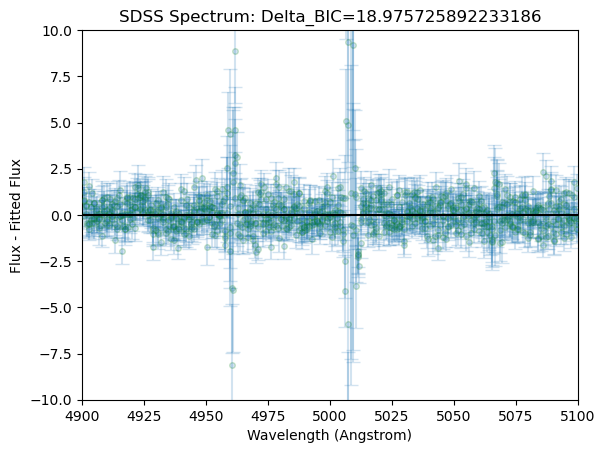

0


In [158]:
plate_list = []
mjd_list  = []
fiber_list  = []

for i in range(len(selection)):
    print(i)
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    gal_nobroad = galaxy_data_nobroad[(galaxy_data_nobroad['plate']==int(plate)) & (galaxy_data_nobroad['mjd']==int(mjd))&(galaxy_data_nobroad['fiber']==int(fiber))]
    
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    print(plate + "-" + mjd+ "-"+ fiber)
    fits_directory = "C:/Users/nihad/pipelines/"

    # Define the name of your FITS file
    fits_filename = "spec-"+plate+"-"+mjd+"-"+fiber+".fits"
    
    # Construct the full path to the FITS file
    fits_path = os.path.join(fits_directory, fits_filename)
    spec_hdu = fits.open(fits_path, memmap=True)
    z = spec_hdu[2].data["z"]
    spec_data = spec_hdu[1].data
    header = spec_hdu[0].header

    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 6500)[0][0]
    max = np.where(np.array(sorted_wave) > 6630)[0][0]
    print(min, max)

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_h_alpha(ranged_wave, gal["h_continuuum"], gal['h'], gal['n_ii'], gal['broad_h'], gal['sigma1_h'], gal['sigma2_h'], gal['v_n_h'], gal['v_b_h'])
    
    #Plots the gaussian with the fits
    fig, ax = plt.subplots()
    plt.plot(ranged_wave, ranged_flux, '-',color = 'black',linewidth=1)
    plt.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1.5, alpha = 0.5)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(gal["h_continuuum"],3)}±{round(gal["h_continuuum_err"],5)}, \noiii={round(gal['h'],5)}±{round(gal['h_err'],5)}, \nhe_i={round(gal['n_ii'],5)}±{round(gal['n_ii_err'],5)}, \nfe_i/ii={round(gal['broad_h'],5)}±{round(gal['broad_h_err'],5)},\nsig1={round(gal['sigma1_h'],5)}±{round(gal['sigma1_h_err'],5)},\nsig2={round(gal['sigma2_h'],5)}±{round(gal['sigma2_h_err'],5)}, \nv_n={round(gal['v_n_h'],5)}±{round(gal['v_n_h_err'],5)},\nv_b={round(gal['v_b_h'],5)}±{round(gal['v_b_h'],5)}", zorder=3)
    plt.plot(ranged_wave, h_alpha(ranged_wave, gal['h'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_1(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, n_ii_2(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, broad(ranged_wave, gal['broad_h'], gal['sigma2_h'], gal['v_b_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)

    
    plt.legend(loc='upper left', fontsize = 8)
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(6500, 6630)
    plt.ylim(-2, int(np.max(ranged_flux))+int(np.max(ranged_flux))/5)

    
    inset = inset_axes(ax, width='40%', height='30%', loc='upper right',)
    inset.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=5), '-',color = 'black',linewidth=1)
    inset.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1, zorder=3)
    inset.plot(ranged_wave, h_alpha(ranged_wave, gal['h'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, n_ii_1(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, n_ii_2(ranged_wave, gal['n_ii'], gal['sigma1_h'], gal['v_n_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, broad(ranged_wave, gal['broad_h'], gal['sigma2_h'], gal['v_b_h'])+gal["h_continuuum"], '-',color = 'green',linewidth=3)
    inset.set_xlim(6500, 6630)
    inset.set_ylim(gal["h_continuuum"], gal["h_continuuum"]+4*gal['broad_h'])
    mark_inset(ax, inset, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

    
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h.png")
    plt.show()

    fit_y_nobroad = Gauss_h_alpha_no_broad(ranged_wave, gal_nobroad["h_continuuum_nobroad"], gal_nobroad['h_nobroad'], gal_nobroad['n_ii_nobroad'], gal_nobroad['sigma_h_nobroad'], gal_nobroad['v_n_h_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 8*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 5*np.log(len(ranged_flux))
    
    uncert = [(1/np.sqrt(item)) for item in ranged_ivar]
    plt.errorbar(ranged_wave, err, yerr = uncert, fmt='o',markersize=4, zorder=2.5, capsize=5,alpha = 0.2, markeredgecolor="green", label='Data')
    plt.axhline(y = 0, zorder = 3, color='black')
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux - Fitted Flux")
    plt.title(f"SDSS Spectrum: Delta_BIC={BIC_nobroad-BIC}")
    plt.xlim(6500, 6630)
    plt.ylim(-10, 10)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_h_residuals.png")
    plt.show()

   
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 4900)[0][0]
    max = np.where(np.array(sorted_wave) > 5100)[0][0]
    print(min, max)

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_oiii(ranged_wave, gal["oiii_continuuum"], gal['oiii'], gal['he_i'], gal['fe_i/ii'], gal['h_beta'], gal['broad_oiii'], gal['sigma1_oiii'], gal['sigma2_oiii'], gal['v_n_oiii'], gal['v_b_oiii'])

    #Plots the gaussian with the fits
    fig, ax = plt.subplots()
    plt.plot(ranged_wave, ranged_flux, '-',color = 'black',linewidth=1)
    plt.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1.5, label=f"continuum={round(gal["oiii_continuuum"],3)}±{round(gal["oiii_continuuum_err"],5)}, \noiii={round(gal['oiii'],5)}±{round(gal['oiii_err'],5)}, \nhe_i={round(gal['he_i'],5)}±{round(gal['he_i_err'],5)}, \nfe_i/ii={round(gal['fe_i/ii'],5)}±{round(gal['fe_i/ii_err'],5)}, \n h_beta={round(gal['h_beta'],5)}±{round(gal['h_beta_err'],5)},\nbroad={round(gal['broad_oiii'],5)}±{round(gal['broad_oiii_err'],5)},\nsig1={round(gal['sigma1_oiii'],5)}±{round(gal['sigma1_oiii_err'],5)},\nsig2={round(gal['sigma2_oiii'],5)}±{round(gal['sigma2_oiii_err'],5)}, \nv_n={round(gal['v_n_oiii'],5)}±{round(gal['v_n_oiii_err'],5)},\nv_b={round(gal['v_b_oiii'],5)}±{round(gal['v_b_oiii_err'],5)}", zorder=3)
    plt.plot(ranged_wave, o_iii_1(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, o_iii_2(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, he_i(ranged_wave, gal['he_i'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, fe(ranged_wave, gal['fe_i/ii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, h_beta(ranged_wave, gal['h_beta'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    plt.plot(ranged_wave, broad_1(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    plt.plot(ranged_wave, broad_2(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)

    plt.legend(loc='upper left', fontsize = 8)
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.xlim(4900,5100)
    plt.ylim(-2, int(np.max(ranged_flux))+int(np.max(ranged_flux))/5)

    
    inset = inset_axes(ax, width='40%', height='30%', loc='upper right',)
    inset.plot(ranged_wave, scipy.signal.medfilt(ranged_flux, kernel_size=9), '-',color = 'black',linewidth=1)
    inset.plot(ranged_wave, fit_y, '--',color = 'red',linewidth=1, zorder=3)
    inset.plot(ranged_wave, o_iii_1(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, o_iii_2(ranged_wave, gal['oiii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, he_i(ranged_wave, gal['he_i'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, fe(ranged_wave, gal['fe_i/ii'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, h_beta(ranged_wave, gal['h_beta'], gal['sigma1_oiii'], gal['v_n_oiii'])+gal["oiii_continuuum"], '-',color = 'green',linewidth=3)
    inset.plot(ranged_wave, broad_1(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    inset.plot(ranged_wave, broad_2(ranged_wave, gal['broad_oiii'], gal['sigma2_oiii'], gal['v_b_oiii'])+gal["oiii_continuuum"], '-',color = 'purple',linewidth=3)
    inset.set_xlim(4900,5100)
    inset.set_ylim(gal["oiii_continuuum"], gal["oiii_continuuum"]+4*gal['broad_oiii'])
    mark_inset(ax, inset, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

    
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oiii.png")
    plt.show()

    fit_y_nobroad = Gauss_oiii_no_broad(ranged_wave, gal_nobroad["oiii_continuuum_nobroad"], gal_nobroad['oiii_nobroad'], gal_nobroad['he_i_nobroad'], gal_nobroad['fe_i/ii_nobroad'], gal_nobroad['h_beta_nobroad'], gal_nobroad['sigma_oiii_nobroad'], gal_nobroad['v_n_oiii_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 10*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 7*np.log(len(ranged_flux))
    
    uncert = [(1/np.sqrt(item)) for item in ranged_ivar]
    plt.errorbar(ranged_wave, err, yerr = uncert, fmt='o',markersize=4, zorder=2.5, capsize=5,alpha = 0.2, markeredgecolor="green", label='Data')
    plt.axhline(y = 0, zorder = 3, color='black')
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux - Fitted Flux")
    plt.title(f"SDSS Spectrum: Delta_BIC={BIC_nobroad-BIC}")
    plt.xlim(4900,5100)
    plt.ylim(-10, 10)
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"gaussian_oiii_residuals.png")
    
    plt.show()
   
print(len(plate_list))

In [162]:
for i in range(len(selection)):
    print(i)
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    gal_nobroad = galaxy_data_nobroad[(galaxy_data_nobroad['plate']==int(plate)) & (galaxy_data_nobroad['mjd']==int(mjd))&(galaxy_data_nobroad['fiber']==int(fiber))]
    
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    print(plate + "-" + mjd+ "-"+ fiber)
    fits_directory = "C:/Users/nihad/pipelines/"

    # Define the name of your FITS file
    fits_filename = "spec-"+plate+"-"+mjd+"-"+fiber+".fits"
    
    # Construct the full path to the FITS file
    fits_path = os.path.join(fits_directory, fits_filename)
    spec_hdu = fits.open(fits_path, memmap=True)
    z = spec_hdu[2].data["z"]
    spec_data = spec_hdu[1].data
    header = spec_hdu[0].header

    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()

    
    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+nexp//2+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 6500)[0][0]
    max = np.where(np.array(sorted_wave) > 6630)[0][0]

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_h_alpha(ranged_wave, gal["h_continuuum"], gal['h'], gal['n_ii'], gal['broad_h'], gal['sigma1_h'], gal['sigma2_h'], gal['v_n_h'], gal['v_b_h'])

    fit_y_nobroad = Gauss_h_alpha_no_broad(ranged_wave, gal_nobroad["h_continuuum_nobroad"], gal_nobroad['h_nobroad'], gal_nobroad['n_ii_nobroad'], gal_nobroad['sigma_h_nobroad'], gal_nobroad['v_n_h_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 8*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 5*np.log(len(ranged_flux))

    print(BIC_nobroad-BIC)

    flux_sum =[]
    wave_sum = []
    ivar_sum = []
    filter = []
    nexp = header['NEXP']
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar'] 
        flux_sum.extend(sub_flux[sub_ivar>0])
        wave_sum.extend(sub_wavelength[sub_ivar>0])
        ivar_sum.extend(sub_ivar[sub_ivar>0])
        filter.extend([sub_exp for _ in range(len(sub_flux[sub_ivar>0]))])

    combined = sorted(zip(wave_sum, flux_sum,ivar_sum,filter))
    # Unzip the sorted pairs back into separate lists
    sorted_wave, sorted_flux, sorted_ivar, sorted_filter = zip(*combined) 

    min = np.where(np.array(sorted_wave) > 4900)[0][0]
    max = np.where(np.array(sorted_wave) > 5100)[0][0]

    inf = math.inf
    ranged_wave = sorted_wave[min:max]
    ranged_flux = sorted_flux[min:max]
    ranged_ivar = sorted_ivar[min:max]
    fit_y = Gauss_oiii(ranged_wave, gal["oiii_continuuum"], gal['oiii'], gal['he_i'], gal['fe_i/ii'], gal['h_beta'], gal['broad_oiii'], gal['sigma1_oiii'], gal['sigma2_oiii'], gal['v_n_oiii'], gal['v_b_oiii'])

    fit_y_nobroad = Gauss_oiii_no_broad(ranged_wave, gal_nobroad["oiii_continuuum_nobroad"], gal_nobroad['oiii_nobroad'], gal_nobroad['he_i_nobroad'], gal_nobroad['fe_i/ii_nobroad'], gal_nobroad['h_beta_nobroad'], gal_nobroad['sigma_oiii_nobroad'], gal_nobroad['v_n_oiii_nobroad'])
    
    err = (ranged_flux-fit_y)
    chi_square = np.square(err)*np.square(ranged_ivar)
    BIC = sum(chi_square) - 10*np.log(len(ranged_flux))

    err_nobroad = (ranged_flux-fit_y_nobroad)
    chi_square_nobroad = np.square(err_nobroad)*np.square(ranged_ivar)
    BIC_nobroad = sum(chi_square_nobroad) - 7*np.log(len(ranged_flux))

    print(BIC_nobroad-BIC)
    
print(len(plate_list))

0
5649-55912-0445
171.48735888483202
34.473946307952474
1
6479-56364-0245
1205.4396429820658
14.502733708862252
2
6513-56543-0640
498.91815597727236
37.99828979723543
3
6641-56383-0398
1271.4611496445507
327.2869138318158
4
7337-56686-0642
-4.571840031883767
24.626185343309317
5
7572-56944-0383
225.4028303997652
311.1370461494064
6
7650-57575-0100
144.72848459489614
47.73509940839631
7
7759-58401-0167
263.17962831795603
32.759696257592395
8
7845-56980-0693
30.443919251546504
39.015802589325176
9
8058-57196-0925
108.11235217193507
18.975725892233186
0


In [166]:
for i in range(len(selection)):
    gal = selection[i]
    plate = str(gal["plate"])
    mjd = str(gal["mjd"])
    fiber = str(gal["fiber"])
    if len(fiber) < 4:
        zero_pad = ""
        for j in range(4-len(fiber)):
            zero_pad += "0"
        fiber = zero_pad + fiber
    im1 = plate + "-" + mjd+ "-"+ fiber+"gaussian_h.png"      
    im2 = plate + "-" + mjd+ "-"+fiber+"gaussian_h_residuals.png"
    merge = merge_images(im1, im2)
    merge.save(str(2*i)+".jpeg")
    im1 = plate + "-" + mjd+ "-"+ fiber+"gaussian_oiii.png"        
    im2 = plate + "-" + mjd+ "-"+fiber+"gaussian_oiii_residuals.png"
    merge = merge_images(im1, im2)
    merge.save(str(2*i+1)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(len(selection)*2):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)    
pdf.output("Gaussian_graphs_h.pdf")

In [ ]:
#Add chi-squared and reduced chi-squared to the table